# Penelitian kasus Covid-19 dengan tujuan pemerataan Vaksin secara merata dan sesuai target yang ada

## Anggota Kelompok :
#### 10121157 - Ilmi Fathurrahman Ghazali 
#### 10121126 - Hilman Hadi Saputra 
#### 10121131 - Muhammad Rizky 
#### 10121147 - Hosni Mubarok
#### 10121158 - Bayu Rahmana Putra 

## Foto Kerja Kelompok

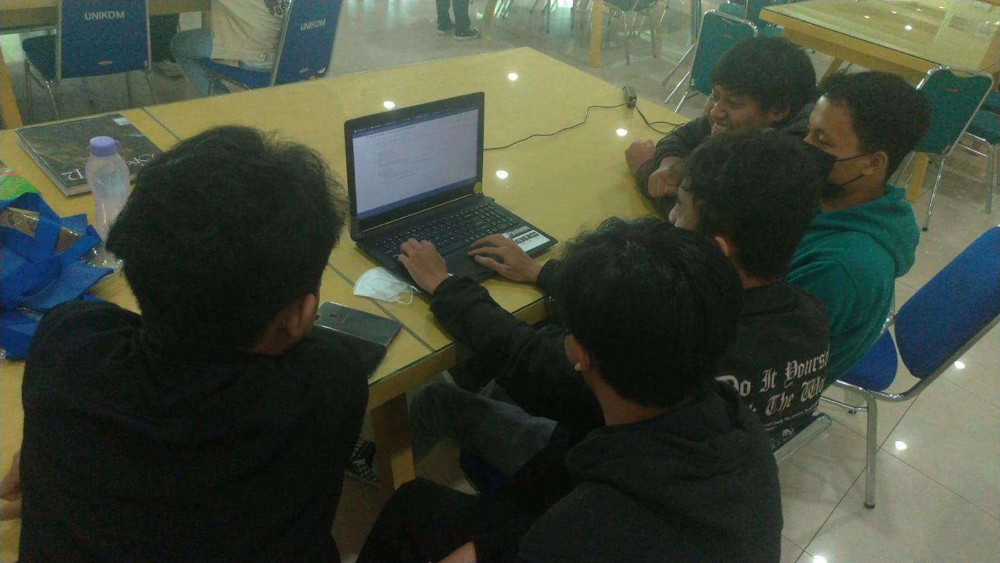

In [2]:
#Foto-Foto Kelompok
from IPython.display import Image
Image(filename='Foto-Foto/gambar2.jpg')

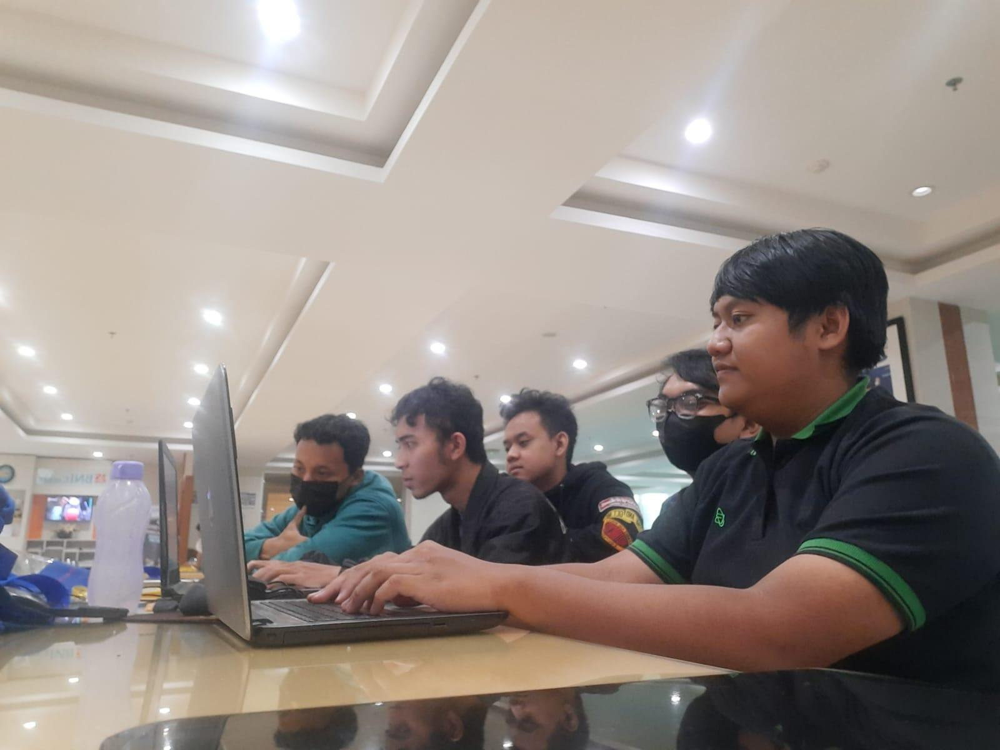

In [3]:
Image(filename='Foto-Foto/gambar1.jpg')

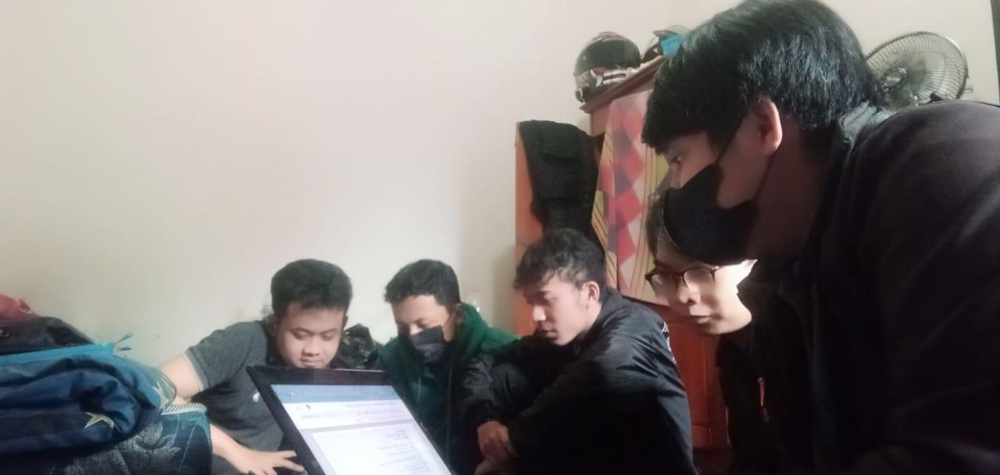

In [4]:
Image(filename='Foto-Foto/gambar3.jpg')

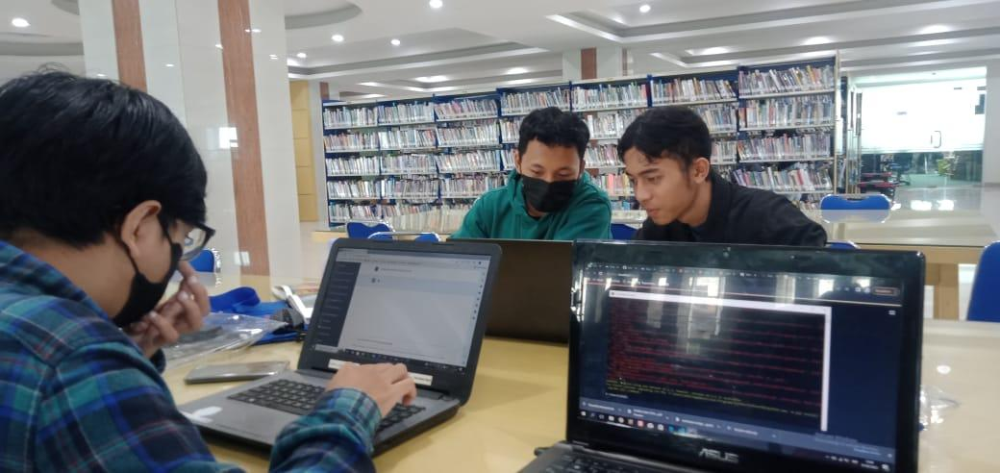

In [5]:
Image(filename='Foto-Foto/gambar4.jpg')

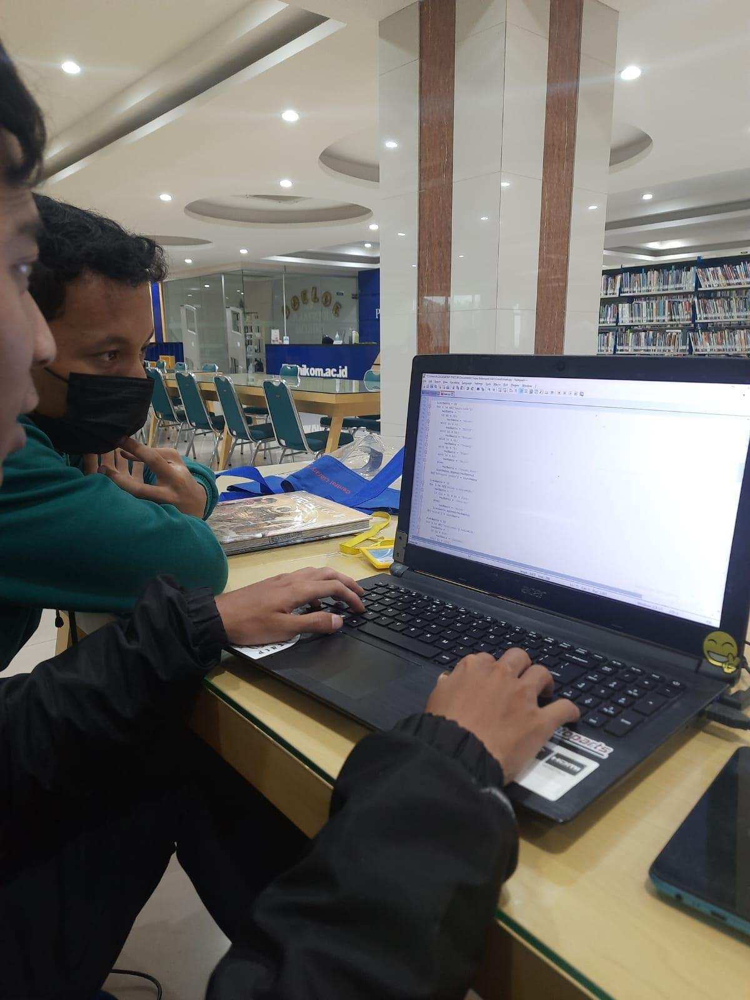

In [6]:
Image(filename='Foto-Foto/gambar5.jpg')

## Latar Belakang Dan Tujuan

### Latar Belakang :
#### Covid-19 merupakan pandemi global yang menimbulkan dampak besar bagi masyarakat dan perekonomian. Adanya pandemi ini menimbulkan kekhawatiran terhadap pemerataan pemberian vaksin bagi masyarakat,dengan dibuatkan program ini diharapkan pemerataan vaksinasi di berbagai provinsi dapat tersalurkan dengan baik dan sesuai target berdasarkan dengan jumlah total kasus,kasus aktif dan data lainnya di berbagai provinsi yang ada di indonesia
### Tujuan :
#### Penelitian kasus Covid-19 secara merata dan sesuai target ini bertujuan untuk memastikan bahwa vaksin diberikan secara adil dan sesuai dengan target yang ditetapkan. Ini akan membantu mengurangi kekhawatiran masyarakat dan membantu mengatasi dampak pandemi secara lebih efektif.

## Isi Tugas Besar :

# Import Library & Module Yang Dibutuhkan

In [7]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap
from folium import plugins
import matplotlib.pyplot as plt
import datetime as dt
import folium
import plotly.graph_objects as go
from pandas_profiling import ProfileReport
import streamlit as st

# Read CSV

In [8]:
data = pd.read_csv('covid_19_indonesia_time_series_all.csv')
data

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,Latitude,New Cases per Million,Total Cases per Million,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths
0,3/1/2020,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,-6.204699,0.18,3.60,0.0,1.84,0.18,51.28%,192.31%,NaN,NaN
1,3/2/2020,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,-6.204699,0.18,3.78,0.0,1.84,0.18,48.78%,182.93%,1.00,1.00
2,3/2/2020,IDN,Indonesia,2,0,0,2,2,0,0,...,-0.789275,0.01,0.01,0.0,0.00,0.00,0.00%,0.00%,NaN,NaN
3,3/2/2020,ID-RI,Riau,1,0,0,1,1,0,1,...,0.511648,0.16,0.16,0.0,0.00,0.00,0.00%,100.00%,NaN,NaN
4,3/3/2020,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,-6.204699,0.18,3.96,0.0,1.84,0.18,46.51%,174.42%,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31817,9/15/2022,ID-SA,Sulawesi Utara,37,0,0,37,52770,1213,50997,...,1.259638,14.01,19974.38,0.0,459.14,45.91,2.30%,96.64%,2.85,1.00
31818,9/15/2022,ID-SB,Sumatera Barat,13,0,3,10,104640,2371,102066,...,-0.850253,2.36,18959.11,0.0,429.59,42.96,2.27%,97.54%,6.50,1.00
31819,9/15/2022,ID-SS,Sumatera Selatan,16,0,1,15,82198,3376,78510,...,-3.216212,1.95,10002.74,0.0,410.83,41.08,4.11%,95.51%,3.20,1.00
31820,9/15/2022,ID-SU,Sumatera Utara,50,0,5,45,158866,3288,154924,...,2.191894,3.36,10680.15,0.0,221.04,22.10,2.07%,97.52%,1.92,1.00


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31822 entries, 0 to 31821
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Date                         31822 non-null  object 
 1   Location ISO Code            31822 non-null  object 
 2   Location                     31822 non-null  object 
 3   New Cases                    31822 non-null  int64  
 4   New Deaths                   31822 non-null  int64  
 5   New Recovered                31822 non-null  int64  
 6   New Active Cases             31822 non-null  int64  
 7   Total Cases                  31822 non-null  int64  
 8   Total Deaths                 31822 non-null  int64  
 9   Total Recovered              31822 non-null  int64  
 10  Total Active Cases           31822 non-null  int64  
 11  Location Level               31822 non-null  object 
 12  City or Regency              0 non-null      float64
 13  Province        

In [10]:
data['Date'] = pd.to_datetime(data['Date'],format='%m/%d/%Y')
data['Tahun'] = data['Date'].dt.year
data['Bulan'] = data['Date'].dt.month
data['Hari'] = data['Date'].dt.day

data

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths,Tahun,Bulan,Hari
0,2020-03-01,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,0.0,1.84,0.18,51.28%,192.31%,NaN,NaN,2020,3,1
1,2020-03-02,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,0.0,1.84,0.18,48.78%,182.93%,1.00,1.00,2020,3,2
2,2020-03-02,IDN,Indonesia,2,0,0,2,2,0,0,...,0.0,0.00,0.00,0.00%,0.00%,NaN,NaN,2020,3,2
3,2020-03-02,ID-RI,Riau,1,0,0,1,1,0,1,...,0.0,0.00,0.00,0.00%,100.00%,NaN,NaN,2020,3,2
4,2020-03-03,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,0.0,1.84,0.18,46.51%,174.42%,1.00,1.00,2020,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31817,2022-09-15,ID-SA,Sulawesi Utara,37,0,0,37,52770,1213,50997,...,0.0,459.14,45.91,2.30%,96.64%,2.85,1.00,2022,9,15
31818,2022-09-15,ID-SB,Sumatera Barat,13,0,3,10,104640,2371,102066,...,0.0,429.59,42.96,2.27%,97.54%,6.50,1.00,2022,9,15
31819,2022-09-15,ID-SS,Sumatera Selatan,16,0,1,15,82198,3376,78510,...,0.0,410.83,41.08,4.11%,95.51%,3.20,1.00,2022,9,15
31820,2022-09-15,ID-SU,Sumatera Utara,50,0,5,45,158866,3288,154924,...,0.0,221.04,22.10,2.07%,97.52%,1.92,1.00,2022,9,15


In [11]:
data.describe()

,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,City or Regency,Total Regencies,...,New Cases per Million,Total Cases per Million,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Growth Factor of New Cases,Growth Factor of New Deaths,Tahun,Bulan,Hari
count,31822.000000,31822.000000,31822.000000,31822.000000,3.182200e+04,31822.000000,3.182200e+04,31822.000000,0.0,31822.000000,...,31822.000000,31822.000000,31822.000000,31822.000000,31822.000000,29883.000000,28375.000000,31822.000000,31822.000000,31822.000000
mean,402.311388,9.920652,390.398498,1.992238,1.594500e+05,4564.753221,1.492615e+05,5623.782415,NaN,24.027277,...,28.133292,11485.038800,0.640308,289.633640,28.963329,1.326795,1.033834,2020.968921,6.436365,15.692037
std,2320.629838,64.139080,2199.878802,1219.513355,6.264435e+05,17693.731369,5.958536e+05,28537.412305,NaN,68.359734,...,74.309710,16477.385479,1.933016,363.428724,36.342881,2.679379,1.351755,0.773047,3.189877,8.816180
min,0.000000,0.000000,0.000000,-29938.000000,1.000000e+00,0.000000,0.000000e+00,-2343.000000,NaN,1.000000,...,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,2020.000000,1.000000,1.000000
25%,3.000000,0.000000,2.000000,-12.000000,5.223250e+03,128.000000,3.913500e+03,80.000000,NaN,7.000000,...,0.830000,1291.367500,0.000000,38.862500,3.890000,0.650000,0.750000,2020.000000,4.000000,8.000000
50%,27.000000,0.000000,20.000000,0.000000,2.359650e+04,565.500000,2.102750e+04,557.000000,NaN,11.000000,...,5.710000,6804.285000,0.000000,158.415000,15.840000,1.000000,1.000000,2021.000000,6.000000,16.000000
75%,130.000000,3.000000,123.000000,19.000000,6.992775e+04,2189.000000,6.414200e+04,2279.000000,NaN,18.000000,...,22.290000,14557.360000,0.540000,389.910000,38.990000,1.310000,1.000000,2022.000000,9.000000,23.000000
max,64718.000000,2069.000000,61361.000000,39165.000000,6.405044e+06,157876.000000,6.218708e+06,586113.000000,NaN,416.000000,...,1459.040000,130231.620000,63.800000,1632.600000,163.260000,175.000000,134.500000,2022.000000,12.000000,31.000000


In [12]:
data.isnull().mean()*100

Date                             0.000000
Location ISO Code                0.000000
Location                         0.000000
New Cases                        0.000000
New Deaths                       0.000000
New Recovered                    0.000000
New Active Cases                 0.000000
Total Cases                      0.000000
Total Deaths                     0.000000
Total Recovered                  0.000000
Total Active Cases               0.000000
Location Level                   0.000000
City or Regency                100.000000
Province                         2.919364
Country                          0.000000
Continent                        0.000000
Island                           2.919364
Time Zone                        2.919364
Special Status                  85.676576
Total Regencies                  0.000000
Total Cities                     2.831375
Total Districts                  0.000000
Total Urban Villages             2.840802
Total Rural Villages             2

In [13]:
data.isna().mean()*100

Date                             0.000000
Location ISO Code                0.000000
Location                         0.000000
New Cases                        0.000000
New Deaths                       0.000000
New Recovered                    0.000000
New Active Cases                 0.000000
Total Cases                      0.000000
Total Deaths                     0.000000
Total Recovered                  0.000000
Total Active Cases               0.000000
Location Level                   0.000000
City or Regency                100.000000
Province                         2.919364
Country                          0.000000
Continent                        0.000000
Island                           2.919364
Time Zone                        2.919364
Special Status                  85.676576
Total Regencies                  0.000000
Total Cities                     2.831375
Total Districts                  0.000000
Total Urban Villages             2.840802
Total Rural Villages             2

In [14]:
data = data.drop('City or Regency',axis=1)

In [15]:
data['Special Status'].value_counts()

Daerah Khusus             2715
Daerah Khusus Ibu Kota     929
Daerah Istimewa            914
Name: Special Status, dtype: int64

In [16]:
data = data.drop('Special Status', axis=1)

In [17]:
data['Growth Factor of New Cases'].head(10)

0    NaN
1    1.0
2    NaN
3    NaN
4    1.0
5    0.0
6    NaN
7    0.0
8    1.0
9    1.0
Name: Growth Factor of New Cases, dtype: float64

In [18]:
data['Growth Factor of New Cases'] = data['Growth Factor of New Cases'].fillna(float(0))

In [19]:
data['Growth Factor of New Deaths'] = data['Growth Factor of New Deaths'].fillna(float(0))

In [20]:
data[['Province','Island','Time Zone']]

,Province,Island,Time Zone
0,DKI Jakarta,Jawa,UTC+07:00
1,DKI Jakarta,Jawa,UTC+07:00
2,NaN,NaN,NaN
3,Riau,Sumatera,UTC+07:00
4,DKI Jakarta,Jawa,UTC+07:00
...,...,...,...
31817,Sulawesi Utara,Sulawesi,UTC+08:00
31818,Sumatera Barat,Sumatera,UTC+07:00
31819,Sumatera Selatan,Sumatera,UTC+07:00
31820,Sumatera Utara,Sumatera,UTC+07:00


In [21]:
data.update(data[['Province','Island','Time Zone']].fillna('Unknown'))

In [22]:
data[['Location','Province','Total Cities','Total Urban Villages','Total Rural Villages']]

,Location,Province,Total Cities,Total Urban Villages,Total Rural Villages
0,DKI Jakarta,DKI Jakarta,5.0,267.0,NaN
1,DKI Jakarta,DKI Jakarta,5.0,267.0,NaN
2,Indonesia,Unknown,98.0,8488.0,74953.0
3,Riau,Riau,2.0,268.0,1591.0
4,DKI Jakarta,DKI Jakarta,5.0,267.0,NaN
...,...,...,...,...,...
31817,Sulawesi Utara,Sulawesi Utara,4.0,332.0,1507.0
31818,Sumatera Barat,Sumatera Barat,7.0,230.0,928.0
31819,Sumatera Selatan,Sumatera Selatan,4.0,387.0,2853.0
31820,Sumatera Utara,Sumatera Utara,8.0,693.0,5417.0


In [23]:
data['Total Rural Villages'] = data['Total Rural Villages'].fillna(float(0))

In [24]:
data[['Province','Total Active Cases','Total Cities','Total Urban Villages','Total Rural Villages']]

,Province,Total Active Cases,Total Cities,Total Urban Villages,Total Rural Villages
0,DKI Jakarta,-56,5.0,267.0,0.0
1,DKI Jakarta,-54,5.0,267.0,0.0
2,Unknown,2,98.0,8488.0,74953.0
3,Riau,0,2.0,268.0,1591.0
4,DKI Jakarta,-52,5.0,267.0,0.0
...,...,...,...,...,...
31817,Sulawesi Utara,560,4.0,332.0,1507.0
31818,Sumatera Barat,203,7.0,230.0,928.0
31819,Sumatera Selatan,312,4.0,387.0,2853.0
31820,Sumatera Utara,654,8.0,693.0,5417.0


In [25]:
data['Total Cities'] = data['Total Cities'].fillna(float(0))

In [26]:
data[['Location','Province','Total Active Cases','Total Cities','Total Urban Villages','Total Rural Villages']]

,Location,Province,Total Active Cases,Total Cities,Total Urban Villages,Total Rural Villages
0,DKI Jakarta,DKI Jakarta,-56,5.0,267.0,0.0
1,DKI Jakarta,DKI Jakarta,-54,5.0,267.0,0.0
2,Indonesia,Unknown,2,98.0,8488.0,74953.0
3,Riau,Riau,0,2.0,268.0,1591.0
4,DKI Jakarta,DKI Jakarta,-52,5.0,267.0,0.0
...,...,...,...,...,...,...
31817,Sulawesi Utara,Sulawesi Utara,560,4.0,332.0,1507.0
31818,Sumatera Barat,Sumatera Barat,203,7.0,230.0,928.0
31819,Sumatera Selatan,Sumatera Selatan,312,4.0,387.0,2853.0
31820,Sumatera Utara,Sumatera Utara,654,8.0,693.0,5417.0


In [27]:
data['Total Urban Villages'].fillna(float(0), inplace=True)

data.isna().mean()*100

Date                           0.0
Location ISO Code              0.0
Location                       0.0
New Cases                      0.0
New Deaths                     0.0
New Recovered                  0.0
New Active Cases               0.0
Total Cases                    0.0
Total Deaths                   0.0
Total Recovered                0.0
Total Active Cases             0.0
Location Level                 0.0
Province                       0.0
Country                        0.0
Continent                      0.0
Island                         0.0
Time Zone                      0.0
Total Regencies                0.0
Total Cities                   0.0
Total Districts                0.0
Total Urban Villages           0.0
Total Rural Villages           0.0
Area (km2)                     0.0
Population                     0.0
Population Density             0.0
Longitude                      0.0
Latitude                       0.0
New Cases per Million          0.0
Total Cases per Mill

In [28]:
data[['Location ISO Code', 'Location', 'Province','Country','Continent','Island']]

,Location ISO Code,Location,Province,Country,Continent,Island
0,ID-JK,DKI Jakarta,DKI Jakarta,Indonesia,Asia,Jawa
1,ID-JK,DKI Jakarta,DKI Jakarta,Indonesia,Asia,Jawa
2,IDN,Indonesia,Unknown,Indonesia,Asia,Unknown
3,ID-RI,Riau,Riau,Indonesia,Asia,Sumatera
4,ID-JK,DKI Jakarta,DKI Jakarta,Indonesia,Asia,Jawa
...,...,...,...,...,...,...
31817,ID-SA,Sulawesi Utara,Sulawesi Utara,Indonesia,Asia,Sulawesi
31818,ID-SB,Sumatera Barat,Sumatera Barat,Indonesia,Asia,Sumatera
31819,ID-SS,Sumatera Selatan,Sumatera Selatan,Indonesia,Asia,Sumatera
31820,ID-SU,Sumatera Utara,Sumatera Utara,Indonesia,Asia,Sumatera


In [29]:
data['Date'] = pd.to_datetime(data['Date'],format='%m/%d/%Y')
data['Tahun'] = data['Date'].dt.year
data['Bulan'] = data['Date'].dt.month
data['Hari'] = data['Date'].dt.day

data

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths,Tahun,Bulan,Hari
0,2020-03-01,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,0.0,1.84,0.18,51.28%,192.31%,0.00,0.00,2020,3,1
1,2020-03-02,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,0.0,1.84,0.18,48.78%,182.93%,1.00,1.00,2020,3,2
2,2020-03-02,IDN,Indonesia,2,0,0,2,2,0,0,...,0.0,0.00,0.00,0.00%,0.00%,0.00,0.00,2020,3,2
3,2020-03-02,ID-RI,Riau,1,0,0,1,1,0,1,...,0.0,0.00,0.00,0.00%,100.00%,0.00,0.00,2020,3,2
4,2020-03-03,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,0.0,1.84,0.18,46.51%,174.42%,1.00,1.00,2020,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31817,2022-09-15,ID-SA,Sulawesi Utara,37,0,0,37,52770,1213,50997,...,0.0,459.14,45.91,2.30%,96.64%,2.85,1.00,2022,9,15
31818,2022-09-15,ID-SB,Sumatera Barat,13,0,3,10,104640,2371,102066,...,0.0,429.59,42.96,2.27%,97.54%,6.50,1.00,2022,9,15
31819,2022-09-15,ID-SS,Sumatera Selatan,16,0,1,15,82198,3376,78510,...,0.0,410.83,41.08,4.11%,95.51%,3.20,1.00,2022,9,15
31820,2022-09-15,ID-SU,Sumatera Utara,50,0,5,45,158866,3288,154924,...,0.0,221.04,22.10,2.07%,97.52%,1.92,1.00,2022,9,15


# Scrapping Web

In [24]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

url = 'https://www.worldometers.info/coronavirus/'
page = requests.get(url)

soup = BeautifulSoup(page.text, 'lxml')
table1 = soup.find('table', id='main_table_countries_today')

headers = []
for th in table1.find_all('th'):
    title = th.text
    headers.append(title)
headers[13] = 'Tests/1M pop'

mydata = pd.DataFrame(columns=headers)
for tr in table1.find_all('tr')[1:]:
    row_data = tr.find_all('td')
    row = [td.text for td in row_data]
    length = len(mydata)
    mydata.loc[length] = row

mydata.drop(mydata.index[0:7], inplace=True)
mydata.drop(mydata.index[222:229], inplace=True)
mydata.reset_index(inplace=True, drop=True)
mydata.drop('#', inplace=True, axis=1)
mydata.to_csv('covid_data_dunia.csv', index=False)


In [25]:
mydata2 = pd.read_csv('covid_data_dunia.csv')
mydata2

,"Country,Other",TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,...,TotalTests,Tests/1M pop,Population,Continent,1 Caseevery X ppl,1 Deathevery X ppl,1 Testevery X ppl,New Cases/1M pop,New Deaths/1M pop,Active Cases/1M pop
0,World,"676,308,428","+58,831","6,772,533",449.0,"648,756,753","+128,613","20,779,142","41,633","86,764",...,NaN,NaN,NaN,All,\n,NaN,NaN,NaN,NaN,NaN
1,USA,"104,488,837",NaN,"1,136,313",NaN,"101,575,749",NaN,"1,776,775","3,383","312,088",...,"1,160,827,663","3,467,173","334,805,269",North America,3,295,0.0,NaN,NaN,"5,307"
2,India,"44,683,454",NaN,"530,745",NaN,"44,150,892",NaN,"1,817",698,"31,766",...,"916,215,668","651,354","1,406,631,776",Asia,31,"2,650",2.0,NaN,NaN,1
3,France,"39,533,323",NaN,"164,286",NaN,"39,288,720","+1,235","80,317",869,"602,784",...,"271,490,188","4,139,547","65,584,518",Europe,2,399,0.0,NaN,NaN,"1,225"
4,Germany,"37,822,577",NaN,"166,128",NaN,"37,451,400","+20,900","205,049","1,281","450,894",...,"122,332,384","1,458,359","83,883,596",Europe,2,505,1.0,NaN,NaN,"2,444"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228,Total:,"67,761,872",+85,"1,348,114",28.0,"65,907,921","+2,691","505,837","10,226",NaN,...,NaN,NaN,NaN,South America,,NaN,NaN,NaN,NaN,NaN
229,Total:,"13,905,992",NaN,"25,446",NaN,"13,743,749",NaN,"136,797",78,NaN,...,NaN,NaN,NaN,Australia/Oceania,,NaN,NaN,NaN,NaN,NaN
230,Total:,"12,778,845",NaN,"258,525",NaN,"12,063,770",NaN,"456,550",547,NaN,...,NaN,NaN,NaN,Africa,,NaN,NaN,NaN,NaN,NaN
231,Total:,721,NaN,15,NaN,706,NaN,0,0,NaN,...,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN


# Cleaning Data Scrapping WEB

In [26]:
import pandas as pd
import unicodedata
df = pd.read_csv("covid_data_dunia.csv") 
df

,"Country,Other",TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,...,TotalTests,Tests/1M pop,Population,Continent,1 Caseevery X ppl,1 Deathevery X ppl,1 Testevery X ppl,New Cases/1M pop,New Deaths/1M pop,Active Cases/1M pop
0,World,"676,308,428","+58,831","6,772,533",449.0,"648,756,753","+128,613","20,779,142","41,633","86,764",...,NaN,NaN,NaN,All,\n,NaN,NaN,NaN,NaN,NaN
1,USA,"104,488,837",NaN,"1,136,313",NaN,"101,575,749",NaN,"1,776,775","3,383","312,088",...,"1,160,827,663","3,467,173","334,805,269",North America,3,295,0.0,NaN,NaN,"5,307"
2,India,"44,683,454",NaN,"530,745",NaN,"44,150,892",NaN,"1,817",698,"31,766",...,"916,215,668","651,354","1,406,631,776",Asia,31,"2,650",2.0,NaN,NaN,1
3,France,"39,533,323",NaN,"164,286",NaN,"39,288,720","+1,235","80,317",869,"602,784",...,"271,490,188","4,139,547","65,584,518",Europe,2,399,0.0,NaN,NaN,"1,225"
4,Germany,"37,822,577",NaN,"166,128",NaN,"37,451,400","+20,900","205,049","1,281","450,894",...,"122,332,384","1,458,359","83,883,596",Europe,2,505,1.0,NaN,NaN,"2,444"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228,Total:,"67,761,872",+85,"1,348,114",28.0,"65,907,921","+2,691","505,837","10,226",NaN,...,NaN,NaN,NaN,South America,,NaN,NaN,NaN,NaN,NaN
229,Total:,"13,905,992",NaN,"25,446",NaN,"13,743,749",NaN,"136,797",78,NaN,...,NaN,NaN,NaN,Australia/Oceania,,NaN,NaN,NaN,NaN,NaN
230,Total:,"12,778,845",NaN,"258,525",NaN,"12,063,770",NaN,"456,550",547,NaN,...,NaN,NaN,NaN,Africa,,NaN,NaN,NaN,NaN,NaN
231,Total:,721,NaN,15,NaN,706,NaN,0,0,NaN,...,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN


In [27]:
df.columns = df.columns.str.replace('\u00A0', ' ') #Menghapus karakter unik di Tot Cases/1M pop
df.drop(columns=['Tot Cases/1M pop','NewCases', 
         'NewDeaths','NewRecovered','Serious,Critical',
         'Deaths/1M pop','TotalTests',
         'Tests/1M pop','Population','Continent',
         '1 Caseevery X ppl','1 Deathevery X ppl','1 Testevery X ppl',
         'New Cases/1M pop','New Deaths/1M pop','Active Cases/1M pop'], inplace=True) #Drop kolom
df

,"Country,Other",TotalCases,TotalDeaths,TotalRecovered,ActiveCases
0,World,"676,308,428","6,772,533","648,756,753","20,779,142"
1,USA,"104,488,837","1,136,313","101,575,749","1,776,775"
2,India,"44,683,454","530,745","44,150,892","1,817"
3,France,"39,533,323","164,286","39,288,720","80,317"
4,Germany,"37,822,577","166,128","37,451,400","205,049"
...,...,...,...,...,...
228,Total:,"67,761,872","1,348,114","65,907,921","505,837"
229,Total:,"13,905,992","25,446","13,743,749","136,797"
230,Total:,"12,778,845","258,525","12,063,770","456,550"
231,Total:,721,15,706,0


In [28]:
df.tail(15)

,"Country,Other",TotalCases,TotalDeaths,TotalRecovered,ActiveCases
218,Macao,"3,499",121,"3,358",20
219,Saint Pierre Miquelon,"3,452",2,"2,449","1,001"
220,Wallis and Futuna,"3,427",7,438,"2,982"
221,Tuvalu,"2,805",,NaN,"2,805"
222,MS Zaandam,9,2,7,0
223,Tokelau,5,,NaN,5
224,China,"503,302","5,272","379,053","118,977"
225,Total:,"123,664,681","1,600,494","118,594,860","3,469,327"
226,Total:,"213,186,926","1,531,326","197,720,631","13,934,969"
227,Total:,"245,009,391","2,008,613","240,725,116","2,275,662"


In [29]:
#Menghapus Data Total yang tidak dibutuhkan
index_list = [225, 226, 227, 228, 229, 230, 231, 232]
df = df.drop(index_list)
df.tail(10)

,"Country,Other",TotalCases,TotalDeaths,TotalRecovered,ActiveCases
215,Kiribati,"5,008",18,"2,703","2,287"
216,Nauru,"4,621",1,"4,609",11
217,Anguilla,"3,904",12,"3,879",13
218,Macao,"3,499",121,"3,358",20
219,Saint Pierre Miquelon,"3,452",2,"2,449","1,001"
220,Wallis and Futuna,"3,427",7,438,"2,982"
221,Tuvalu,"2,805",,NaN,"2,805"
222,MS Zaandam,9,2,7,0
223,Tokelau,5,,NaN,5
224,China,"503,302","5,272","379,053","118,977"


In [30]:
#Merubah data NaN menjadi 0
df.index = df.index.fillna(0)
df = df.fillna(0)
df.tail()

,"Country,Other",TotalCases,TotalDeaths,TotalRecovered,ActiveCases
220,Wallis and Futuna,"3,427",7,438,"2,982"
221,Tuvalu,"2,805",,0,"2,805"
222,MS Zaandam,9,2,7,0
223,Tokelau,5,,0,5
224,China,"503,302","5,272","379,053","118,977"


In [31]:
#Jadikan file CSV
df.to_csv('covid_data_dunia_cleaned.csv', index=False)

# Menampilkan Peta & Wilayah Indonesia Yang Terjangkit Covid

In [ ]:
geometry = gpd.points_from_xy(data.Longitude, data.Latitude)
geo_df = gpd.GeoDataFrame(
    data[["Latitude", "Longitude","Location","Total Cases"]], geometry=geometry
)

geo_df

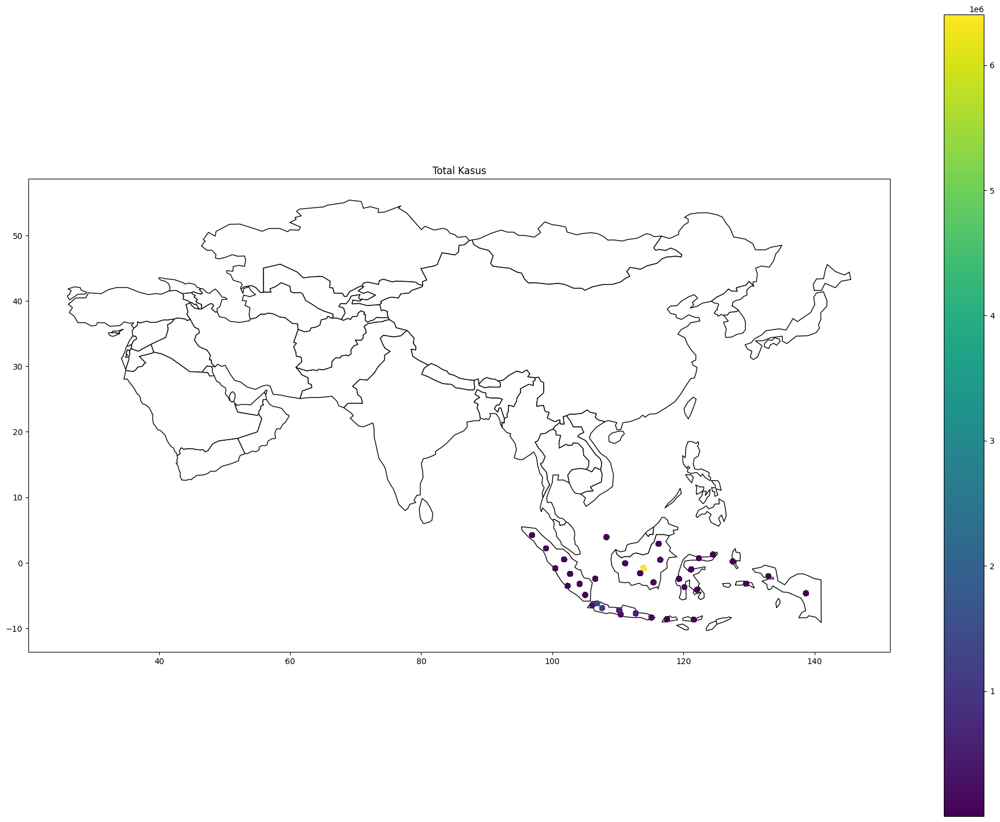

In [31]:
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
fig, ax = plt.subplots(figsize=(24, 18))

world[world.continent == 'Asia'].plot(ax=ax,color='white', edgecolor='black')
geo_df.plot(column="Total Cases", ax=ax, legend=True, figsize=(24, 18))


plt.title("Total Kasus")
plt.show()

# Menampilkan Peta Heat Map Kasus Covid Di Indonesia

In [32]:
map = folium.Map(location=[15, 30], tiles="Cartodb dark_matter", zoom_start=2)

heat_data = [[point.xy[1][0], point.xy[0][0]] for point in geo_df.geometry]

heat_data
plugins.HeatMap(heat_data).add_to(map)

map

# Mencari Kategori Kasus & Sembuh

In [33]:
bantu = []
for i in data['Total Cases']:
    listBantu = ''
    if (i < 1000):
        listBantu= 'Ringan'
    elif (i < 10000):
        listBantu = 'Menengah'
    elif (i < 50000):
        listBantu= 'Kuat'
    else:
        listBantu = 'Sangat kuat'
    bantu.append(listBantu)
data['Kategori Kasus'] = bantu

  
bantu= []
for i in data['Total Recovered']:
    listBantu = ''
    if (i < 250):
        listBantu = 'Sedikit'
    elif (i < 5000):
        listBantu = 'Sedang'
    else:
        listBantu = 'Tinggi'
    bantu.append(listBantu)
data['kategori Total Recovered'] = bantu


In [34]:
data = pd.read_csv("covid_19_indonesia_time_series_all.csv")
data.head(5)

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,Latitude,New Cases per Million,Total Cases per Million,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths
0,3/1/2020,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,-6.204699,0.18,3.60,0.0,1.84,0.18,51.28%,192.31%,NaN,NaN
1,3/2/2020,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,-6.204699,0.18,3.78,0.0,1.84,0.18,48.78%,182.93%,1.0,1.0
2,3/2/2020,IDN,Indonesia,2,0,0,2,2,0,0,...,-0.789275,0.01,0.01,0.0,0.00,0.00,0.00%,0.00%,NaN,NaN
3,3/2/2020,ID-RI,Riau,1,0,0,1,1,0,1,...,0.511648,0.16,0.16,0.0,0.00,0.00,0.00%,100.00%,NaN,NaN
4,3/3/2020,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,-6.204699,0.18,3.96,0.0,1.84,0.18,46.51%,174.42%,1.0,1.0


In [35]:
data['Date'] = pd.to_datetime(data['Date'],format='%m/%d/%Y')
data['Tahun'] = data['Date'].dt.year
data['Bulan'] = data['Date'].dt.month
data['Hari'] = data['Date'].dt.day

data

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths,Tahun,Bulan,Hari
0,2020-03-01,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,0.0,1.84,0.18,51.28%,192.31%,NaN,NaN,2020,3,1
1,2020-03-02,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,0.0,1.84,0.18,48.78%,182.93%,1.00,1.00,2020,3,2
2,2020-03-02,IDN,Indonesia,2,0,0,2,2,0,0,...,0.0,0.00,0.00,0.00%,0.00%,NaN,NaN,2020,3,2
3,2020-03-02,ID-RI,Riau,1,0,0,1,1,0,1,...,0.0,0.00,0.00,0.00%,100.00%,NaN,NaN,2020,3,2
4,2020-03-03,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,0.0,1.84,0.18,46.51%,174.42%,1.00,1.00,2020,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31817,2022-09-15,ID-SA,Sulawesi Utara,37,0,0,37,52770,1213,50997,...,0.0,459.14,45.91,2.30%,96.64%,2.85,1.00,2022,9,15
31818,2022-09-15,ID-SB,Sumatera Barat,13,0,3,10,104640,2371,102066,...,0.0,429.59,42.96,2.27%,97.54%,6.50,1.00,2022,9,15
31819,2022-09-15,ID-SS,Sumatera Selatan,16,0,1,15,82198,3376,78510,...,0.0,410.83,41.08,4.11%,95.51%,3.20,1.00,2022,9,15
31820,2022-09-15,ID-SU,Sumatera Utara,50,0,5,45,158866,3288,154924,...,0.0,221.04,22.10,2.07%,97.52%,1.92,1.00,2022,9,15


In [36]:
data.info()
data[0:10]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31822 entries, 0 to 31821
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Date                         31822 non-null  datetime64[ns]
 1   Location ISO Code            31822 non-null  object        
 2   Location                     31822 non-null  object        
 3   New Cases                    31822 non-null  int64         
 4   New Deaths                   31822 non-null  int64         
 5   New Recovered                31822 non-null  int64         
 6   New Active Cases             31822 non-null  int64         
 7   Total Cases                  31822 non-null  int64         
 8   Total Deaths                 31822 non-null  int64         
 9   Total Recovered              31822 non-null  int64         
 10  Total Active Cases           31822 non-null  int64         
 11  Location Level               31822 non-nu

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths,Tahun,Bulan,Hari
0,2020-03-01,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,0.00,1.84,0.18,51.28%,192.31%,NaN,NaN,2020,3,1
1,2020-03-02,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,0.00,1.84,0.18,48.78%,182.93%,1.0,1.0,2020,3,2
2,2020-03-02,IDN,Indonesia,2,0,0,2,2,0,0,...,0.00,0.00,0.00,0.00%,0.00%,NaN,NaN,2020,3,2
3,2020-03-02,ID-RI,Riau,1,0,0,1,1,0,1,...,0.00,0.00,0.00,0.00%,100.00%,NaN,NaN,2020,3,2
4,2020-03-03,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,0.00,1.84,0.18,46.51%,174.42%,1.0,1.0,2020,3,3
5,2020-03-03,IDN,Indonesia,0,0,0,0,2,0,0,...,0.00,0.00,0.00,0.00%,0.00%,0.0,1.0,2020,3,3
6,2020-03-03,ID-JB,Jawa Barat,1,1,0,0,1,1,60,...,0.02,0.02,0.00,100.00%,6000.00%,NaN,NaN,2020,3,3
7,2020-03-03,ID-RI,Riau,0,0,0,0,1,0,1,...,0.00,0.00,0.00,0.00%,100.00%,0.0,1.0,2020,3,3
8,2020-03-04,ID-JK,DKI Jakarta,2,0,0,2,45,20,75,...,0.00,1.84,0.18,44.44%,166.67%,1.0,1.0,2020,3,4
9,2020-03-04,IDN,Indonesia,0,0,0,0,2,0,0,...,0.00,0.00,0.00,0.00%,0.00%,1.0,1.0,2020,3,4


In [37]:
covid_new = data.copy()
covid_new.head(5)

,Date,Location ISO Code,Location,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,...,New Deaths per Million,Total Deaths per Million,Total Deaths per 100rb,Case Fatality Rate,Case Recovered Rate,Growth Factor of New Cases,Growth Factor of New Deaths,Tahun,Bulan,Hari
0,2020-03-01,ID-JK,DKI Jakarta,2,0,0,2,39,20,75,...,0.0,1.84,0.18,51.28%,192.31%,NaN,NaN,2020,3,1
1,2020-03-02,ID-JK,DKI Jakarta,2,0,0,2,41,20,75,...,0.0,1.84,0.18,48.78%,182.93%,1.0,1.0,2020,3,2
2,2020-03-02,IDN,Indonesia,2,0,0,2,2,0,0,...,0.0,0.00,0.00,0.00%,0.00%,NaN,NaN,2020,3,2
3,2020-03-02,ID-RI,Riau,1,0,0,1,1,0,1,...,0.0,0.00,0.00,0.00%,100.00%,NaN,NaN,2020,3,2
4,2020-03-03,ID-JK,DKI Jakarta,2,0,0,2,43,20,75,...,0.0,1.84,0.18,46.51%,174.42%,1.0,1.0,2020,3,3


In [38]:
covid_new.drop(["Location ISO Code", "New Cases", "New Deaths", "New Recovered", "New Active Cases", "Province", "Country", "Continent", "Island", "Time Zone", 
                "Special Status", "Total Regencies", "Total Cities", "Total Districts", "Total Urban Villages", "Total Rural Villages", "Area (km2)", 
                "New Cases per Million", "Total Cases per Million","New Deaths per Million", "Total Deaths per Million", "Case Fatality Rate",
                "Case Recovered Rate", "Growth Factor of New Cases","Growth Factor of New Deaths", "City or Regency"],axis=1,inplace=True)

In [39]:
covid_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31822 entries, 0 to 31821
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    31822 non-null  datetime64[ns]
 1   Location                31822 non-null  object        
 2   Total Cases             31822 non-null  int64         
 3   Total Deaths            31822 non-null  int64         
 4   Total Recovered         31822 non-null  int64         
 5   Total Active Cases      31822 non-null  int64         
 6   Location Level          31822 non-null  object        
 7   Population              31822 non-null  int64         
 8   Population Density      31822 non-null  float64       
 9   Longitude               31822 non-null  float64       
 10  Latitude                31822 non-null  float64       
 11  Total Deaths per 100rb  31822 non-null  float64       
 12  Tahun                   31822 non-null  int64 

In [40]:
covid_final = covid_new.drop_duplicates(subset='Location', keep="last")
covid_final

,Date,Location,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Population,Population Density,Longitude,Latitude,Total Deaths per 100rb,Tahun,Bulan,Hari
31759,2022-09-14,Gorontalo,13951,487,13433,31,Province,1180651,104.88,122.376058,0.687003,41.25,2022,9,14
31780,2022-09-14,Sulawesi Barat,15601,394,15201,6,Province,1559984,92.93,119.345019,-2.461746,25.26,2022,9,14
31788,2022-09-15,Aceh,44038,2223,41713,102,Province,5247257,90.54,96.910522,4.225615,42.36,2022,9,15
31789,2022-09-15,Bali,166831,4731,161629,471,Province,4216171,729.43,115.131714,-8.369472,112.21,2022,9,15
31790,2022-09-15,Banten,333875,2950,328482,2443,Province,10722374,1109.64,106.109004,-6.456736,27.51,2022,9,15
31791,2022-09-15,Bengkulu,29173,522,28617,34,Province,1999539,100.38,102.338421,-3.533584,26.11,2022,9,15
31792,2022-09-15,DKI Jakarta,1412511,15513,1386134,10864,Province,10846145,16334.31,106.836118,-6.204699,143.03,2022,9,15
31793,2022-09-15,Daerah Istimewa Yogyakarta,224307,5928,217712,667,Province,3631015,1158.90,110.444878,-7.894502,163.26,2022,9,15
31795,2022-09-15,Jambi,38643,889,37681,73,Province,3493357,69.79,102.723640,-1.697698,25.45,2022,9,15
31796,2022-09-15,Jawa Barat,1173731,15937,1144358,13436,Province,45161325,1276.55,107.603708,-6.920432,35.29,2022,9,15


In [41]:
prov = gpd.read_file('prov.shp')
prov.drop(["NAME_0"],axis=1,inplace=True)
prov.rename(columns = {"NAME_1":"Provinsi"}, inplace = True)
prov['Provinsi'].replace({"Jakarta Raya":"DKI Jakarta"},inplace=True)

In [42]:
covid_final.rename(columns={
    'Location':'Provinsi'
},inplace=True)
covid_final

C:\Users\ASUS\AppData\Local\Temp\ipykernel_336\2282109455.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_final.rename(columns={


,Date,Provinsi,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Location Level,Population,Population Density,Longitude,Latitude,Total Deaths per 100rb,Tahun,Bulan,Hari
31759,2022-09-14,Gorontalo,13951,487,13433,31,Province,1180651,104.88,122.376058,0.687003,41.25,2022,9,14
31780,2022-09-14,Sulawesi Barat,15601,394,15201,6,Province,1559984,92.93,119.345019,-2.461746,25.26,2022,9,14
31788,2022-09-15,Aceh,44038,2223,41713,102,Province,5247257,90.54,96.910522,4.225615,42.36,2022,9,15
31789,2022-09-15,Bali,166831,4731,161629,471,Province,4216171,729.43,115.131714,-8.369472,112.21,2022,9,15
31790,2022-09-15,Banten,333875,2950,328482,2443,Province,10722374,1109.64,106.109004,-6.456736,27.51,2022,9,15
31791,2022-09-15,Bengkulu,29173,522,28617,34,Province,1999539,100.38,102.338421,-3.533584,26.11,2022,9,15
31792,2022-09-15,DKI Jakarta,1412511,15513,1386134,10864,Province,10846145,16334.31,106.836118,-6.204699,143.03,2022,9,15
31793,2022-09-15,Daerah Istimewa Yogyakarta,224307,5928,217712,667,Province,3631015,1158.90,110.444878,-7.894502,163.26,2022,9,15
31795,2022-09-15,Jambi,38643,889,37681,73,Province,3493357,69.79,102.723640,-1.697698,25.45,2022,9,15
31796,2022-09-15,Jawa Barat,1173731,15937,1144358,13436,Province,45161325,1276.55,107.603708,-6.920432,35.29,2022,9,15


In [43]:
covid_peta = prov.merge(covid_final.sort_values(by='Provinsi'),on='Provinsi')

# Menampilkan Peta Covid-19 Di Indonesia

C:\Users\ASUS\AppData\Local\Temp\ipykernel_336\1957411063.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


Text(0.5, 0.98, 'Peta Covid-19 Indonesia')

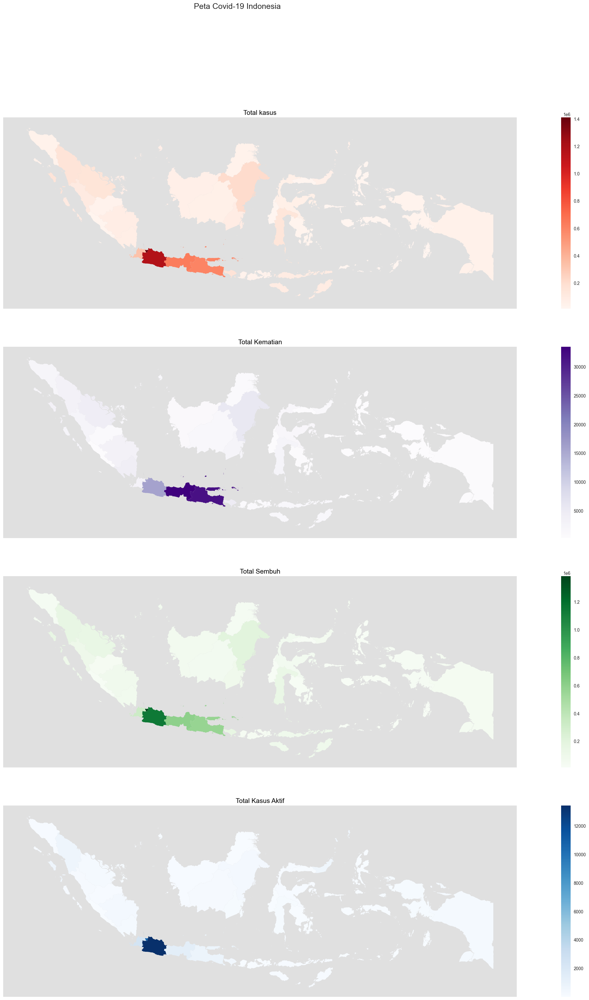

In [44]:
fig,ax = plt.subplots(4,figsize=(36,36))
plt.style.use('seaborn')
covid_peta.plot(column='Total Cases',cmap='Reds',figsize=(9,36),legend=True,ax=ax[0])
ax[0].set_title('Total kasus',fontsize=15)
covid_peta.plot(column='Total Deaths',cmap='Purples',figsize=(9,36),legend=True,ax=ax[1])
ax[1].set_title('Total Kematian',fontsize=15)
covid_peta.plot(column='Total Recovered',cmap='Greens',figsize=(9,36),legend=True,ax=ax[2])
ax[2].set_title('Total Sembuh',fontsize=15)
covid_peta.plot(column='Total Active Cases',cmap='Blues',figsize=(9,36),legend=True,ax=ax[3])
ax[3].set_title('Total Kasus Aktif',fontsize=15)

#add background color
ax[0].set_facecolor('#e0e0e0')
ax[1].set_facecolor('#e0e0e0')
ax[2].set_facecolor('#e0e0e0')
ax[3].set_facecolor('#e0e0e0')

for i in np.arange(4):
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['left'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    for item in ax[i].get_xticklabels():
        item.set_visible(False)
    for item in ax[i].get_yticklabels():
        item.set_visible(False)
    ax[i].set_xticks([])
    ax[i].set_yticks([])
fig.suptitle('Peta Covid-19 Indonesia', fontsize=18)

# Mencari Total Kasus Tertinggi - Terendah Di Berbagai Provinsi

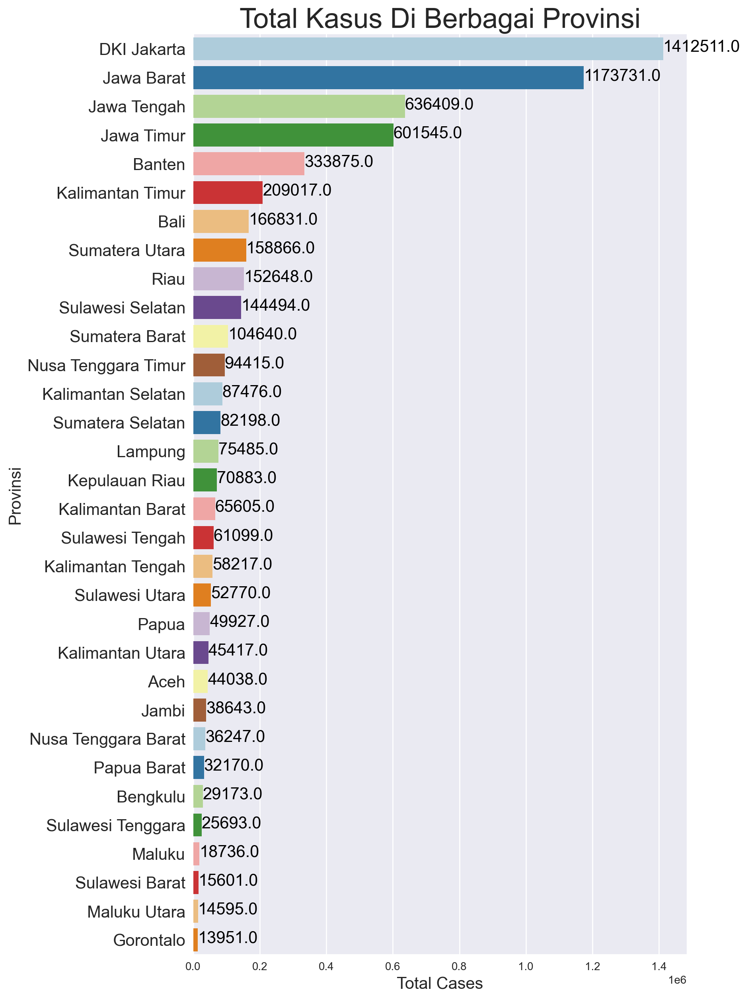

In [45]:
total_cases = covid_peta.sort_values(by=['Total Cases'], ascending=False)
total_cases = total_cases[0:35]
plt.figure(figsize=(8,15),dpi=200)
ax = sns.barplot(data = total_cases,x = total_cases['Total Cases'], y = total_cases['Provinsi'],palette='Paired')
plt.xlabel("Total Cases",fontsize = 15)
plt.ylabel("Provinsi",fontsize = 15)
plt.title('Total Kasus Di Berbagai Provinsi',fontsize = 25)
ax.set_yticklabels(textwrap.fill(y.get_text()) for y in ax.get_yticklabels())
ax.tick_params(axis="y", labelsize=15)
for i in ax.patches:
    ax.text(i.get_width() + .05, i.get_y() + 0.5, str(i.get_width()), fontsize = 15, color = 'black')
plt.show()

# Mencari Total Kasus Aktif Tertinggi - Terendah Di Berbagai Provinsi

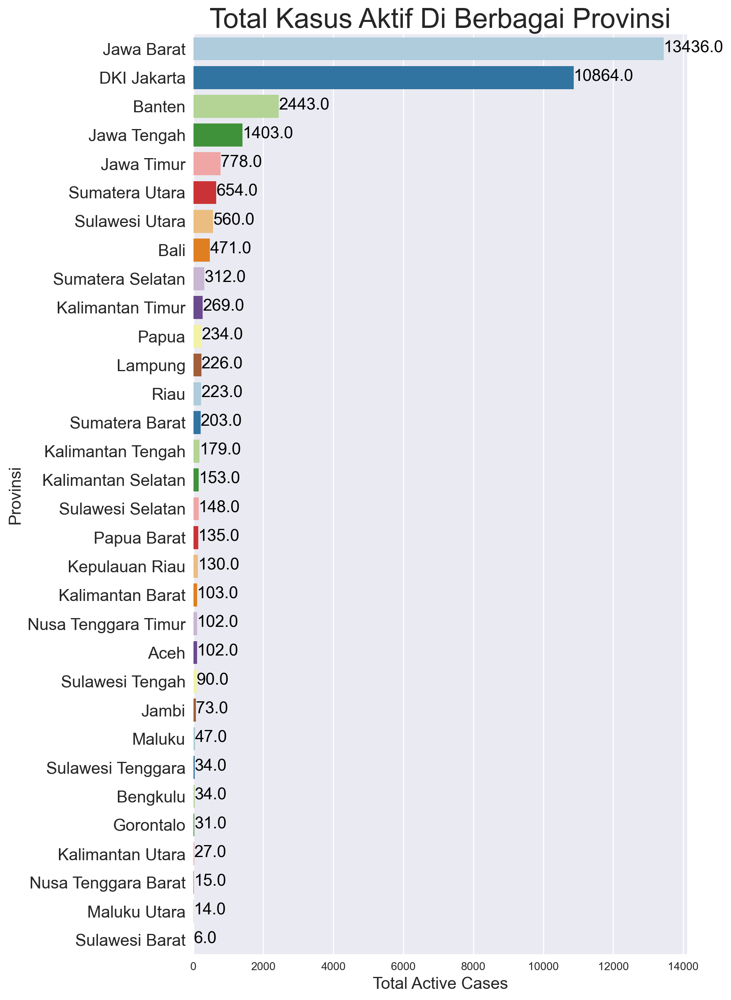

In [46]:
total_active_cases = covid_peta.sort_values(by=['Total Active Cases'], ascending=False)
total_active_cases = total_active_cases[0:35]
plt.figure(figsize=(8,15),dpi=200)
ax = sns.barplot(data = total_active_cases,x = total_active_cases['Total Active Cases'], y = total_active_cases['Provinsi'],palette='Paired')
plt.xlabel("Total Active Cases",fontsize = 15)
plt.ylabel("Provinsi",fontsize = 15)
plt.title('Total Kasus Aktif Di Berbagai Provinsi',fontsize = 25)
ax.set_yticklabels(textwrap.fill(y.get_text()) for y in ax.get_yticklabels())
ax.tick_params(axis="y", labelsize=15)
for i in ax.patches:
    ax.text(i.get_width() + .05, i.get_y() + 0.5, str(i.get_width()), fontsize = 15, color = 'black')
plt.show()

# Mencari Total Kasus Sembuh Tertinggi - Terendah Di Berbagai Provinsi

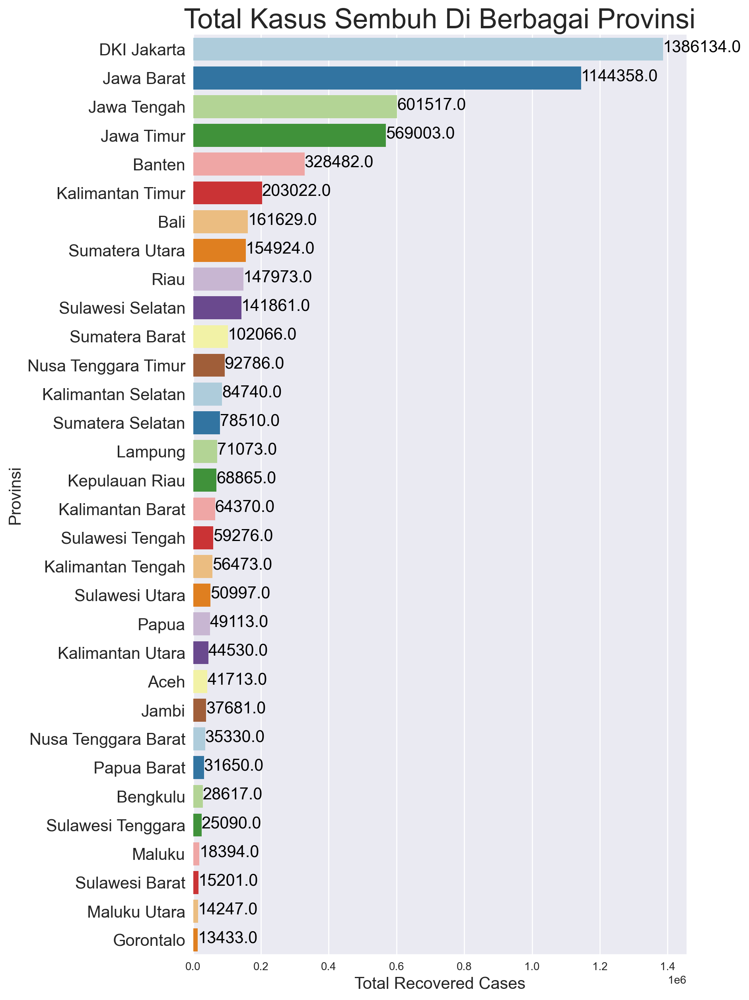

In [47]:
total_active_cases = covid_peta.sort_values(by=['Total Recovered'], ascending=False)
total_active_cases = total_active_cases[0:35]
plt.figure(figsize=(8,15),dpi=200)
ax = sns.barplot(data = total_active_cases,x = total_active_cases['Total Recovered'], y = total_active_cases['Provinsi'],palette='Paired')
plt.xlabel("Total Recovered Cases",fontsize = 15)
plt.ylabel("Provinsi",fontsize = 15)
plt.title('Total Kasus Sembuh Di Berbagai Provinsi',fontsize = 25)
ax.set_yticklabels(textwrap.fill(y.get_text()) for y in ax.get_yticklabels())
ax.tick_params(axis="y", labelsize=15)
for i in ax.patches:
    ax.text(i.get_width() + .05, i.get_y() + 0.5, str(i.get_width()), fontsize = 15, color = 'black')
plt.show()

# Mencari Total Kasus Kematian Tertinggi - Terendah Di Berbagai Provinsi

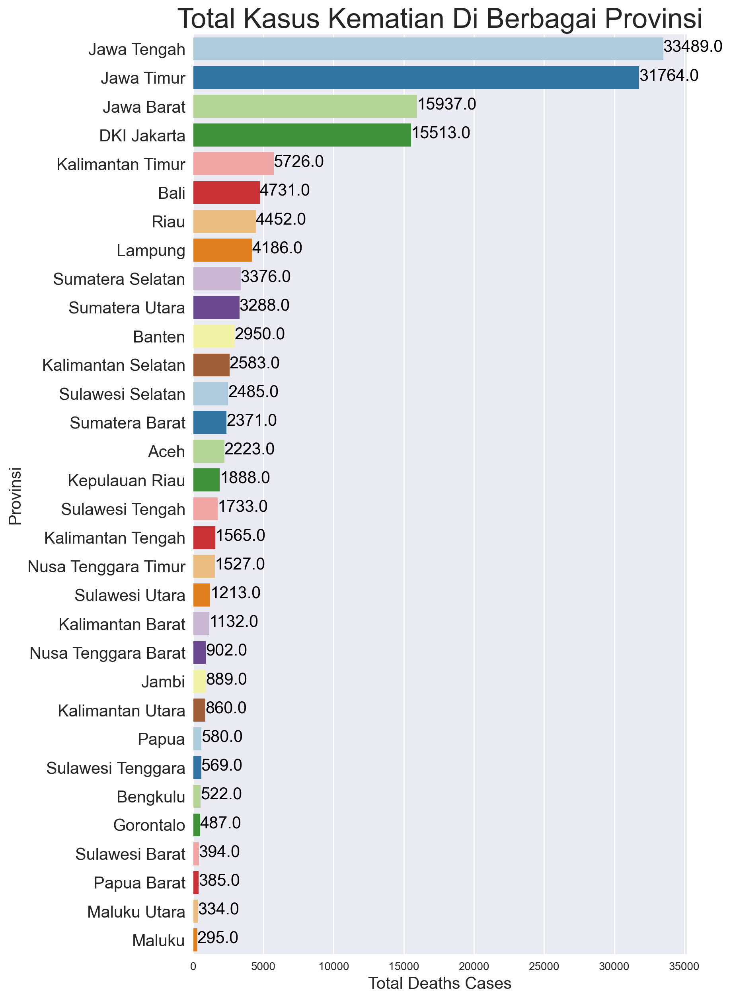

In [48]:
total_active_cases = covid_peta.sort_values(by=['Total Deaths'], ascending=False)
total_active_cases = total_active_cases[0:35]
plt.figure(figsize=(8,15),dpi=200)
ax = sns.barplot(data = total_active_cases,x = total_active_cases['Total Deaths'], y = total_active_cases['Provinsi'],palette='Paired')
plt.xlabel("Total Deaths Cases",fontsize = 15)
plt.ylabel("Provinsi",fontsize = 15)
plt.title('Total Kasus Kematian Di Berbagai Provinsi',fontsize = 25)
ax.set_yticklabels(textwrap.fill(y.get_text()) for y in ax.get_yticklabels())
ax.tick_params(axis="y", labelsize=15)
for i in ax.patches:
    ax.text(i.get_width() + .05, i.get_y() + 0.5, str(i.get_width()), fontsize = 15, color = 'black')
plt.show()

# Mencari Kasus Covid Yang Terjadi Di Indonesia

In [49]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
IDN_covid = data[data['Location ISO Code']== 'IDN']
IDN_covid = IDN_covid[columns]
IDN_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
2,2020-03-02,IDN,2,0,0,2,2,0,0,2,3,2020
5,2020-03-03,IDN,0,0,0,0,2,0,0,2,3,2020
9,2020-03-04,IDN,0,0,0,0,2,0,0,2,3,2020
13,2020-03-05,IDN,0,0,0,0,2,0,0,2,3,2020
18,2020-03-06,IDN,2,0,0,2,4,0,0,4,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31690,2022-09-12,IDN,1848,17,3465,-1634,6394340,157787,6204241,32312,9,2022
31725,2022-09-13,IDN,2896,20,3617,-741,6397236,157807,6207858,31571,9,2022
31760,2022-09-14,IDN,2799,21,3938,-1160,6400035,157828,6211796,30411,9,2022
31794,2022-09-15,IDN,2651,21,3915,-1285,6402686,157849,6215711,29126,9,2022


In [50]:
data_covid_total= IDN_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
data_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-02,2,0,0,2,3,2020
1,2020-03-03,2,0,0,2,3,2020
2,2020-03-04,2,0,0,2,3,2020
3,2020-03-05,2,0,0,2,3,2020
4,2020-03-06,4,0,0,4,3,2020
...,...,...,...,...,...,...,...
924,2022-09-12,6394340,157787,6204241,32312,9,2022
925,2022-09-13,6397236,157807,6207858,31571,9,2022
926,2022-09-14,6400035,157828,6211796,30411,9,2022
927,2022-09-15,6402686,157849,6215711,29126,9,2022


In [51]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_covid_total['Date'],
                         y=data_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=data_covid_total['Date'],
                         y=data_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=data_covid_total['Date'],
                         y=data_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=data_covid_total['Date'],
                         y=data_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Indonesia Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di DKI Jakarta

In [52]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
JK_covid = data[data['Location ISO Code']== 'ID-JK']
JK_covid = JK_covid[columns]
JK_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-01,ID-JK,2,0,0,2,39,20,75,-56,3,2020
1,2020-03-02,ID-JK,2,0,0,2,41,20,75,-54,3,2020
4,2020-03-03,ID-JK,2,0,0,2,43,20,75,-52,3,2020
8,2020-03-04,ID-JK,2,0,0,2,45,20,75,-50,3,2020
12,2020-03-05,ID-JK,0,1,0,-1,45,21,75,-51,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31652,2022-09-11,ID-JK,855,3,1429,-577,1410134,15509,1384390,10235,9,2022
31687,2022-09-12,ID-JK,17,3,1350,-1336,1410151,15512,1385740,8899,9,2022
31722,2022-09-13,ID-JK,16,0,313,-297,1410167,15512,1386053,8602,9,2022
31757,2022-09-14,ID-JK,1228,1,23,1204,1411395,15513,1386076,9806,9,2022


In [53]:
JK_covid_total= JK_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
JK_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-01,39,20,75,-56,3,2020
1,2020-03-02,41,20,75,-54,3,2020
2,2020-03-03,43,20,75,-52,3,2020
3,2020-03-04,45,20,75,-50,3,2020
4,2020-03-05,45,21,75,-51,3,2020
...,...,...,...,...,...,...,...
924,2022-09-11,1410134,15509,1384390,10235,9,2022
925,2022-09-12,1410151,15512,1385740,8899,9,2022
926,2022-09-13,1410167,15512,1386053,8602,9,2022
927,2022-09-14,1411395,15513,1386076,9806,9,2022


In [54]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=JK_covid_total['Date'],
                         y=JK_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=JK_covid_total['Date'],
                         y=JK_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=JK_covid_total['Date'],
                         y=JK_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=JK_covid_total['Date'],
                         y=JK_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='DKI JAKARTA Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Banten

In [55]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
BT_covid = data[data['Location ISO Code']== 'ID-BT']
BT_covid = BT_covid[columns]
BT_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
16,2020-03-06,ID-BT,1,0,1,0,1,5,111,-115,3,2020
21,2020-03-07,ID-BT,0,0,0,0,1,5,111,-115,3,2020
26,2020-03-08,ID-BT,1,0,3,-2,2,5,114,-117,3,2020
32,2020-03-09,ID-BT,0,0,0,0,2,5,114,-117,3,2020
38,2020-03-10,ID-BT,0,0,8,-8,2,5,122,-125,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31650,2022-09-11,ID-BT,190,0,110,80,333445,2950,327925,2570,9,2022
31685,2022-09-12,ID-BT,31,0,280,-249,333476,2950,328205,2321,9,2022
31720,2022-09-13,ID-BT,28,0,38,-10,333504,2950,328243,2311,9,2022
31755,2022-09-14,ID-BT,131,0,207,-76,333635,2950,328450,2235,9,2022


In [56]:
BT_covid_total= BT_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
BT_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-06,1,5,111,-115,3,2020
1,2020-03-07,1,5,111,-115,3,2020
2,2020-03-08,2,5,114,-117,3,2020
3,2020-03-09,2,5,114,-117,3,2020
4,2020-03-10,2,5,122,-125,3,2020
...,...,...,...,...,...,...,...
919,2022-09-11,333445,2950,327925,2570,9,2022
920,2022-09-12,333476,2950,328205,2321,9,2022
921,2022-09-13,333504,2950,328243,2311,9,2022
922,2022-09-14,333635,2950,328450,2235,9,2022


In [57]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=BT_covid_total['Date'],
                         y=BT_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=BT_covid_total['Date'],
                         y=BT_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=BT_covid_total['Date'],
                         y=BT_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=BT_covid_total['Date'],
                         y=BT_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Banten Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Jawa Barat

In [58]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
JB_covid = data[data['Location ISO Code']== 'ID-JB']
JB_covid = JB_covid[columns]
JB_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
6,2020-03-03,ID-JB,1,1,0,0,1,1,60,-60,3,2020
10,2020-03-04,ID-JB,1,0,0,1,2,1,60,-59,3,2020
14,2020-03-05,ID-JB,1,0,0,1,3,1,60,-58,3,2020
19,2020-03-06,ID-JB,1,0,0,1,4,1,60,-57,3,2020
24,2020-03-07,ID-JB,0,0,0,0,4,1,60,-57,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31657,2022-09-11,ID-JB,305,0,483,-178,1172935,15937,1143462,13536,9,2022
31692,2022-09-12,ID-JB,49,0,602,-553,1172984,15937,1144064,12983,9,2022
31727,2022-09-13,ID-JB,64,0,146,-82,1173048,15937,1144210,12901,9,2022
31762,2022-09-14,ID-JB,191,0,69,122,1173239,15937,1144279,13023,9,2022


In [59]:
JB_covid_total= JB_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
JB_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-03,1,1,60,-60,3,2020
1,2020-03-04,2,1,60,-59,3,2020
2,2020-03-05,3,1,60,-58,3,2020
3,2020-03-06,4,1,60,-57,3,2020
4,2020-03-07,4,1,60,-57,3,2020
...,...,...,...,...,...,...,...
922,2022-09-11,1172935,15937,1143462,13536,9,2022
923,2022-09-12,1172984,15937,1144064,12983,9,2022
924,2022-09-13,1173048,15937,1144210,12901,9,2022
925,2022-09-14,1173239,15937,1144279,13023,9,2022


In [60]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=JB_covid_total['Date'],
                         y=JB_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=JB_covid_total['Date'],
                         y=JB_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=JB_covid_total['Date'],
                         y=JB_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=JB_covid_total['Date'],
                         y=JB_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Jawa Barat Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Jawa Tengah

In [61]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
JT_covid = data[data['Location ISO Code']== 'ID-JT']
JT_covid = JT_covid[columns]
JT_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
30,2020-03-08,ID-JT,1,1,0,0,1,10,11,-20,3,2020
36,2020-03-09,ID-JT,0,0,0,0,1,10,11,-20,3,2020
42,2020-03-10,ID-JT,0,0,0,0,1,10,11,-20,3,2020
50,2020-03-11,ID-JT,2,1,1,0,3,11,12,-20,3,2020
58,2020-03-12,ID-JT,0,0,0,0,3,11,12,-20,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31658,2022-09-11,ID-JT,68,2,73,-7,636178,33485,601391,1302,9,2022
31693,2022-09-12,ID-JT,0,2,112,-114,636178,33487,601503,1188,9,2022
31728,2022-09-13,ID-JT,0,0,2,-2,636178,33487,601505,1186,9,2022
31763,2022-09-14,ID-JT,123,2,10,111,636301,33489,601515,1297,9,2022


In [62]:
JT_covid_total= JT_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
JT_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-08,1,10,11,-20,3,2020
1,2020-03-09,1,10,11,-20,3,2020
2,2020-03-10,1,10,11,-20,3,2020
3,2020-03-11,3,11,12,-20,3,2020
4,2020-03-12,3,11,12,-20,3,2020
...,...,...,...,...,...,...,...
917,2022-09-11,636178,33485,601391,1302,9,2022
918,2022-09-12,636178,33487,601503,1188,9,2022
919,2022-09-13,636178,33487,601505,1186,9,2022
920,2022-09-14,636301,33489,601515,1297,9,2022


In [63]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=JT_covid_total['Date'],
                         y=JT_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=JT_covid_total['Date'],
                         y=JT_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=JT_covid_total['Date'],
                         y=JT_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=JT_covid_total['Date'],
                         y=JT_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Jawa Timur Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di DIY Yogyakarta

In [64]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
YO_covid = data[data['Location ISO Code']== 'ID-YO']
YO_covid = YO_covid[columns]
YO_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
90,2020-03-16,ID-YO,1,0,0,1,1,0,2,-1,3,2020
100,2020-03-17,ID-YO,0,0,0,0,1,0,2,-1,3,2020
111,2020-03-18,ID-YO,0,0,0,0,1,0,2,-1,3,2020
123,2020-03-19,ID-YO,0,0,0,0,1,0,2,-1,3,2020
137,2020-03-20,ID-YO,1,0,1,0,2,0,3,-1,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31653,2022-09-11,ID-YO,20,0,94,-74,224265,5927,217668,670,9,2022
31688,2022-09-12,ID-YO,2,1,39,-38,224267,5928,217707,632,9,2022
31723,2022-09-13,ID-YO,1,0,3,-2,224268,5928,217710,630,9,2022
31758,2022-09-14,ID-YO,12,0,2,10,224280,5928,217712,640,9,2022


In [65]:
YO_covid_total= YO_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
YO_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-16,1,0,2,-1,3,2020
1,2020-03-17,1,0,2,-1,3,2020
2,2020-03-18,1,0,2,-1,3,2020
3,2020-03-19,1,0,2,-1,3,2020
4,2020-03-20,2,0,3,-1,3,2020
...,...,...,...,...,...,...,...
909,2022-09-11,224265,5927,217668,670,9,2022
910,2022-09-12,224267,5928,217707,632,9,2022
911,2022-09-13,224268,5928,217710,630,9,2022
912,2022-09-14,224280,5928,217712,640,9,2022


In [66]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=YO_covid_total['Date'],
                         y=YO_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=YO_covid_total['Date'],
                         y=YO_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=YO_covid_total['Date'],
                         y=YO_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=YO_covid_total['Date'],
                         y=YO_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Yogyakarta Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Jawa Timur

In [67]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
JI_covid = data[data['Location ISO Code']== 'ID-JI']
JI_covid = JI_covid[columns]
JI_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
115,2020-03-18,ID-JI,7,1,0,6,18,33,337,-352,3,2020
127,2020-03-19,ID-JI,3,0,0,3,21,33,337,-349,3,2020
142,2020-03-20,ID-JI,9,0,0,9,30,33,337,-340,3,2020
157,2020-03-21,ID-JI,9,1,0,8,39,34,337,-332,3,2020
172,2020-03-22,ID-JI,14,0,0,14,53,34,337,-318,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31659,2022-09-11,ID-JI,235,3,246,-14,601185,31756,568667,762,9,2022
31694,2022-09-12,ID-JI,18,4,237,-223,601203,31760,568904,539,9,2022
31729,2022-09-13,ID-JI,21,1,35,-15,601224,31761,568939,524,9,2022
31764,2022-09-14,ID-JI,53,3,21,29,601277,31764,568960,553,9,2022


In [68]:
JI_covid_total= JI_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
JI_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-18,18,33,337,-352,3,2020
1,2020-03-19,21,33,337,-349,3,2020
2,2020-03-20,30,33,337,-340,3,2020
3,2020-03-21,39,34,337,-332,3,2020
4,2020-03-22,53,34,337,-318,3,2020
...,...,...,...,...,...,...,...
907,2022-09-11,601185,31756,568667,762,9,2022
908,2022-09-12,601203,31760,568904,539,9,2022
909,2022-09-13,601224,31761,568939,524,9,2022
910,2022-09-14,601277,31764,568960,553,9,2022


In [69]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=JI_covid_total['Date'],
                         y=JI_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=JI_covid_total['Date'],
                         y=JI_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=JI_covid_total['Date'],
                         y=JI_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=JI_covid_total['Date'],
                         y=JI_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Jawa Timur Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Riau

In [70]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
RI_covid = data[data['Location ISO Code']== 'ID-RI']
RI_covid = RI_covid[columns]
RI_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
3,2020-03-02,ID-RI,1,0,0,1,1,0,1,0,3,2020
7,2020-03-03,ID-RI,0,0,0,0,1,0,1,0,3,2020
11,2020-03-04,ID-RI,0,0,0,0,1,0,1,0,3,2020
15,2020-03-05,ID-RI,0,0,0,0,1,0,1,0,3,2020
20,2020-03-06,ID-RI,0,0,0,0,1,0,1,0,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31674,2022-09-11,ID-RI,32,0,20,12,152609,4452,147933,224,9,2022
31709,2022-09-12,ID-RI,0,0,28,-28,152609,4452,147961,196,9,2022
31744,2022-09-13,ID-RI,4,0,6,-2,152613,4452,147967,194,9,2022
31779,2022-09-14,ID-RI,16,0,5,11,152629,4452,147972,205,9,2022


In [71]:
RI_covid_total= RI_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
RI_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-02,1,0,1,0,3,2020
1,2020-03-03,1,0,1,0,3,2020
2,2020-03-04,1,0,1,0,3,2020
3,2020-03-05,1,0,1,0,3,2020
4,2020-03-06,1,0,1,0,3,2020
...,...,...,...,...,...,...,...
923,2022-09-11,152609,4452,147933,224,9,2022
924,2022-09-12,152609,4452,147961,196,9,2022
925,2022-09-13,152613,4452,147967,194,9,2022
926,2022-09-14,152629,4452,147972,205,9,2022


In [72]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=RI_covid_total['Date'],
                         y=RI_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=RI_covid_total['Date'],
                         y=RI_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=RI_covid_total['Date'],
                         y=RI_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=RI_covid_total['Date'],
                         y=RI_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Riau Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Kepulauan Riau

In [73]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
KR_covid = data[data['Location ISO Code']== 'ID-KR']
KR_covid = KR_covid[columns]
KR_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
129,2020-03-19,ID-KR,1,1,0,0,1,1,0,0,3,2020
144,2020-03-20,ID-KR,0,0,0,0,1,1,0,0,3,2020
159,2020-03-21,ID-KR,0,0,0,0,1,1,0,0,3,2020
174,2020-03-22,ID-KR,0,0,0,0,1,1,0,0,3,2020
191,2020-03-23,ID-KR,0,0,0,0,1,1,0,0,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31666,2022-09-11,ID-KR,14,0,2,12,70868,1888,68857,123,9,2022
31701,2022-09-12,ID-KR,0,0,8,-8,70868,1888,68865,115,9,2022
31736,2022-09-13,ID-KR,0,0,0,0,70868,1888,68865,115,9,2022
31771,2022-09-14,ID-KR,7,0,0,7,70875,1888,68865,122,9,2022


In [74]:
KR_covid_total= KR_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
KR_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-19,1,1,0,0,3,2020
1,2020-03-20,1,1,0,0,3,2020
2,2020-03-21,1,1,0,0,3,2020
3,2020-03-22,1,1,0,0,3,2020
4,2020-03-23,1,1,0,0,3,2020
...,...,...,...,...,...,...,...
906,2022-09-11,70868,1888,68857,123,9,2022
907,2022-09-12,70868,1888,68865,115,9,2022
908,2022-09-13,70868,1888,68865,115,9,2022
909,2022-09-14,70875,1888,68865,122,9,2022


In [75]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=KR_covid_total['Date'],
                         y=KR_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=KR_covid_total['Date'],
                         y=KR_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=KR_covid_total['Date'],
                         y=KR_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=KR_covid_total['Date'],
                         y=KR_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Kepulauan Riau Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sulawesi Barat

In [76]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
SR_covid = data[data['Location ISO Code']== 'ID-SR']
SR_covid = SR_covid[columns]
SR_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
309,2020-03-28,ID-SR,1,0,0,1,1,0,0,1,3,2020
338,2020-03-29,ID-SR,0,0,0,0,1,0,0,1,3,2020
369,2020-03-30,ID-SR,0,0,0,0,1,0,0,1,3,2020
402,2020-03-31,ID-SR,0,0,0,0,1,0,0,1,3,2020
435,2020-04-01,ID-SR,0,0,0,0,1,0,0,1,4,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31640,2022-09-10,ID-SR,1,0,0,1,15600,394,15200,6,9,2022
31675,2022-09-11,ID-SR,0,0,1,-1,15600,394,15201,5,9,2022
31710,2022-09-12,ID-SR,0,0,0,0,15600,394,15201,5,9,2022
31745,2022-09-13,ID-SR,0,0,0,0,15600,394,15201,5,9,2022


In [77]:
SR_covid_total= SR_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SR_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-28,1,0,0,1,3,2020
1,2020-03-29,1,0,0,1,3,2020
2,2020-03-30,1,0,0,1,3,2020
3,2020-03-31,1,0,0,1,3,2020
4,2020-04-01,1,0,0,1,4,2020
...,...,...,...,...,...,...,...
896,2022-09-10,15600,394,15200,6,9,2022
897,2022-09-11,15600,394,15201,5,9,2022
898,2022-09-12,15600,394,15201,5,9,2022
899,2022-09-13,15600,394,15201,5,9,2022


In [78]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SR_covid_total['Date'],
                         y=SR_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SR_covid_total['Date'],
                         y=SR_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SR_covid_total['Date'],
                         y=SR_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SR_covid_total['Date'],
                         y=SR_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sulawesi Barat Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sulawesi Tengah

In [79]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
ST_covid = data[data['Location ISO Code']== 'ID-ST']
ST_covid = ST_covid[columns]
ST_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
257,2020-03-26,ID-ST,1,0,0,1,1,0,0,1,3,2020
283,2020-03-27,ID-ST,0,0,0,0,1,0,0,1,3,2020
311,2020-03-28,ID-ST,1,0,0,1,2,0,0,2,3,2020
340,2020-03-29,ID-ST,0,0,0,0,2,0,0,2,3,2020
371,2020-03-30,ID-ST,0,0,0,0,2,0,0,2,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31677,2022-09-11,ID-ST,4,0,13,-9,61079,1733,59268,78,9,2022
31712,2022-09-12,ID-ST,1,0,7,-6,61080,1733,59275,72,9,2022
31747,2022-09-13,ID-ST,2,0,1,1,61082,1733,59276,73,9,2022
31782,2022-09-14,ID-ST,5,0,0,5,61087,1733,59276,78,9,2022


In [80]:
ST_covid_total= ST_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
ST_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-26,1,0,0,1,3,2020
1,2020-03-27,1,0,0,1,3,2020
2,2020-03-28,2,0,0,2,3,2020
3,2020-03-29,2,0,0,2,3,2020
4,2020-03-30,2,0,0,2,3,2020
...,...,...,...,...,...,...,...
899,2022-09-11,61079,1733,59268,78,9,2022
900,2022-09-12,61080,1733,59275,72,9,2022
901,2022-09-13,61082,1733,59276,73,9,2022
902,2022-09-14,61087,1733,59276,78,9,2022


In [81]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ST_covid_total['Date'],
                         y=ST_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=ST_covid_total['Date'],
                         y=ST_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=ST_covid_total['Date'],
                         y=ST_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=ST_covid_total['Date'],
                         y=ST_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sulawesi Tengah Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sulawesi Tenggara

In [82]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
SG_covid = data[data['Location ISO Code']== 'ID-SG']
SG_covid = SG_covid[columns]
SG_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
44,2020-03-10,ID-SG,1,0,0,1,1,0,0,1
52,2020-03-11,ID-SG,0,0,0,0,1,0,0,1
60,2020-03-12,ID-SG,0,0,0,0,1,0,0,1
68,2020-03-13,ID-SG,0,0,0,0,1,0,0,1
77,2020-03-14,ID-SG,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
31678,2022-09-11,ID-SG,2,0,0,2,25690,569,25088,33
31713,2022-09-12,ID-SG,1,0,1,0,25691,569,25089,33
31748,2022-09-13,ID-SG,0,0,0,0,25691,569,25089,33
31783,2022-09-14,ID-SG,0,0,1,-1,25691,569,25090,32


In [83]:
SG_covid_total= SG_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SG_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-10,1,0,0,1
1,2020-03-11,1,0,0,1
2,2020-03-12,1,0,0,1
3,2020-03-13,1,0,0,1
4,2020-03-14,1,0,0,1
...,...,...,...,...,...
915,2022-09-11,25690,569,25088,33
916,2022-09-12,25691,569,25089,33
917,2022-09-13,25691,569,25089,33
918,2022-09-14,25691,569,25090,32


In [84]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SG_covid_total['Date'],
                         y=SG_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SG_covid_total['Date'],
                         y=SG_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SG_covid_total['Date'],
                         y=SG_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SG_covid_total['Date'],
                         y=SG_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sulawesi Tenggara Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sulawesi Utara

In [85]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
SA_covid = data[data['Location ISO Code']== 'ID-SA']
SA_covid = SA_covid[columns]
SA_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
259,2020-03-26,ID-SA,1,0,1,0,1,1,5,-5
285,2020-03-27,ID-SA,0,0,0,0,1,1,5,-5
313,2020-03-28,ID-SA,0,0,0,0,1,1,5,-5
342,2020-03-29,ID-SA,0,0,0,0,1,1,5,-5
373,2020-03-30,ID-SA,0,0,0,0,1,1,5,-5
...,...,...,...,...,...,...,...,...,...,...
31679,2022-09-11,ID-SA,21,2,24,-5,52716,1211,50945,560
31714,2022-09-12,ID-SA,1,1,51,-51,52717,1212,50996,509
31749,2022-09-13,ID-SA,3,1,0,2,52720,1213,50996,511
31784,2022-09-14,ID-SA,13,0,1,12,52733,1213,50997,523


In [86]:
SA_covid_total= SA_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SA_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-26,1,1,5,-5
1,2020-03-27,1,1,5,-5
2,2020-03-28,1,1,5,-5
3,2020-03-29,1,1,5,-5
4,2020-03-30,1,1,5,-5
...,...,...,...,...,...
899,2022-09-11,52716,1211,50945,560
900,2022-09-12,52717,1212,50996,509
901,2022-09-13,52720,1213,50996,511
902,2022-09-14,52733,1213,50997,523


In [87]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SA_covid_total['Date'],
                         y=SA_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SA_covid_total['Date'],
                         y=SA_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SA_covid_total['Date'],
                         y=SA_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SA_covid_total['Date'],
                         y=SA_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sulawesi Utara Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Gorontalo

In [88]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
GO_covid = data[data['Location ISO Code']== 'ID-GO']
GO_covid = GO_covid[columns]
GO_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
714,2020-04-10,ID-GO,1,0,0,1,1,0,0,1
749,2020-04-11,ID-GO,0,0,0,0,1,0,0,1
784,2020-04-12,ID-GO,0,0,0,0,1,0,0,1
819,2020-04-13,ID-GO,0,0,0,0,1,0,0,1
854,2020-04-14,ID-GO,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
31619,2022-09-10,ID-GO,0,0,0,0,13950,487,13433,30
31654,2022-09-11,ID-GO,0,0,0,0,13950,487,13433,30
31689,2022-09-12,ID-GO,0,0,0,0,13950,487,13433,30
31724,2022-09-13,ID-GO,0,0,0,0,13950,487,13433,30


In [89]:
GO_covid_total= GO_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
GO_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-04-10,1,0,0,1
1,2020-04-11,1,0,0,1
2,2020-04-12,1,0,0,1
3,2020-04-13,1,0,0,1
4,2020-04-14,1,0,0,1
...,...,...,...,...,...
883,2022-09-10,13950,487,13433,30
884,2022-09-11,13950,487,13433,30
885,2022-09-12,13950,487,13433,30
886,2022-09-13,13950,487,13433,30


In [90]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=GO_covid_total['Date'],
                         y=GO_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=GO_covid_total['Date'],
                         y=GO_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=GO_covid_total['Date'],
                         y=GO_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=GO_covid_total['Date'],
                         y=GO_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Gorontalo Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sulawesi Selatan

In [91]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
SN_covid = data[data['Location ISO Code']== 'ID-SN']
SN_covid = SN_covid[columns]
SN_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
131,2020-03-19,ID-SN,2,0,0,2,2,0,5,-3
146,2020-03-20,ID-SN,0,0,0,0,2,0,5,-3
161,2020-03-21,ID-SN,0,0,0,0,2,0,5,-3
178,2020-03-22,ID-SN,0,0,0,0,2,0,5,-3
196,2020-03-23,ID-SN,0,1,0,-1,2,1,5,-4
...,...,...,...,...,...,...,...,...,...,...
31676,2022-09-11,ID-SN,9,0,12,-3,144463,2485,141838,140
31711,2022-09-12,ID-SN,2,0,17,-15,144465,2485,141855,125
31746,2022-09-13,ID-SN,2,0,4,-2,144467,2485,141859,123
31781,2022-09-14,ID-SN,18,0,0,18,144485,2485,141859,141


In [92]:
SN_covid_total= SN_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SN_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-19,2,0,5,-3
1,2020-03-20,2,0,5,-3
2,2020-03-21,2,0,5,-3
3,2020-03-22,2,0,5,-3
4,2020-03-23,2,1,5,-4
...,...,...,...,...,...
906,2022-09-11,144463,2485,141838,140
907,2022-09-12,144465,2485,141855,125
908,2022-09-13,144467,2485,141859,123
909,2022-09-14,144485,2485,141859,141


In [93]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SN_covid_total['Date'],
                         y=SN_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SN_covid_total['Date'],
                         y=SN_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SN_covid_total['Date'],
                         y=SN_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SN_covid_total['Date'],
                         y=SN_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sulawesi Selatan Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Aceh

In [94]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
AC_covid = data[data['Location ISO Code']== 'ID-AC']
AC_covid = AC_covid[columns]
AC_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
238,2020-03-26,ID-AC,1,0,0,1,1,0,1,0
263,2020-03-27,ID-AC,3,0,0,3,4,0,1,3
289,2020-03-28,ID-AC,1,0,0,1,5,0,1,4
317,2020-03-29,ID-AC,0,0,0,0,5,0,1,4
346,2020-03-30,ID-AC,0,0,0,0,5,0,1,4
...,...,...,...,...,...,...,...,...,...,...
31648,2022-09-11,ID-AC,3,0,10,-7,44008,2223,41699,86
31683,2022-09-12,ID-AC,1,0,9,-8,44009,2223,41708,78
31718,2022-09-13,ID-AC,1,0,3,-2,44010,2223,41711,76
31753,2022-09-14,ID-AC,8,0,1,7,44018,2223,41712,83


In [95]:
AC_covid_total= AC_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
AC_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-26,1,0,1,0
1,2020-03-27,4,0,1,3
2,2020-03-28,5,0,1,4
3,2020-03-29,5,0,1,4
4,2020-03-30,5,0,1,4
...,...,...,...,...,...
899,2022-09-11,44008,2223,41699,86
900,2022-09-12,44009,2223,41708,78
901,2022-09-13,44010,2223,41711,76
902,2022-09-14,44018,2223,41712,83


In [96]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=AC_covid_total['Date'],
                         y=AC_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=AC_covid_total['Date'],
                         y=AC_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=AC_covid_total['Date'],
                         y=AC_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=AC_covid_total['Date'],
                         y=AC_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Aceh Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sumatera Utara

In [97]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
SU_covid = data[data['Location ISO Code']== 'ID-SU']
SU_covid = SU_covid[columns]
SU_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
107,2020-03-17,ID-SU,1,1,0,0,1,1,10,-10
119,2020-03-18,ID-SU,0,0,0,0,1,1,10,-10
133,2020-03-19,ID-SU,0,0,0,0,1,1,10,-10
148,2020-03-20,ID-SU,0,0,0,0,1,1,10,-10
163,2020-03-21,ID-SU,0,0,0,0,1,1,10,-10
...,...,...,...,...,...,...,...,...,...,...
31682,2022-09-11,ID-SU,39,0,48,-9,158785,3287,154834,664
31717,2022-09-12,ID-SU,1,1,70,-70,158786,3288,154904,594
31752,2022-09-13,ID-SU,4,0,10,-6,158790,3288,154914,588
31787,2022-09-14,ID-SU,26,0,5,21,158816,3288,154919,609


In [98]:
SU_covid_total= SU_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SU_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-17,1,1,10,-10
1,2020-03-18,1,1,10,-10
2,2020-03-19,1,1,10,-10
3,2020-03-20,1,1,10,-10
4,2020-03-21,1,1,10,-10
...,...,...,...,...,...
908,2022-09-11,158785,3287,154834,664
909,2022-09-12,158786,3288,154904,594
910,2022-09-13,158790,3288,154914,588
911,2022-09-14,158816,3288,154919,609


In [99]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SU_covid_total['Date'],
                         y=SU_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SU_covid_total['Date'],
                         y=SU_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SU_covid_total['Date'],
                         y=SU_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SU_covid_total['Date'],
                         y=SU_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sumatera Utara Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sumatera Barat

In [100]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
SB_covid = data[data['Location ISO Code']== 'ID-SB']
SB_covid = SB_covid[columns]
SB_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
260,2020-03-26,ID-SB,3,0,0,3,3,0,1,2
286,2020-03-27,ID-SB,2,0,0,2,5,0,1,4
314,2020-03-28,ID-SB,0,0,0,0,5,0,1,4
343,2020-03-29,ID-SB,0,0,0,0,5,0,1,4
374,2020-03-30,ID-SB,3,0,0,3,8,0,1,7
...,...,...,...,...,...,...,...,...,...,...
31680,2022-09-11,ID-SB,10,0,1,9,104602,2370,101985,247
31715,2022-09-12,ID-SB,2,0,63,-61,104604,2370,102048,186
31750,2022-09-13,ID-SB,21,1,14,6,104625,2371,102062,192
31785,2022-09-14,ID-SB,2,0,1,1,104627,2371,102063,193


In [101]:
SB_covid_total= SB_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SB_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-26,3,0,1,2
1,2020-03-27,5,0,1,4
2,2020-03-28,5,0,1,4
3,2020-03-29,5,0,1,4
4,2020-03-30,8,0,1,7
...,...,...,...,...,...
899,2022-09-11,104602,2370,101985,247
900,2022-09-12,104604,2370,102048,186
901,2022-09-13,104625,2371,102062,192
902,2022-09-14,104627,2371,102063,193


In [102]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SB_covid_total['Date'],
                         y=SB_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SB_covid_total['Date'],
                         y=SB_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SB_covid_total['Date'],
                         y=SB_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SB_covid_total['Date'],
                         y=SB_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sumatera Barat Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Jambi

In [103]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
JA_covid = data[data['Location ISO Code']== 'ID-JA']
JA_covid = JA_covid[columns]
JA_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
139,2020-03-20,ID-JA,1,0,0,1,1,0,4,-3
154,2020-03-21,ID-JA,0,0,0,0,1,0,4,-3
169,2020-03-22,ID-JA,0,0,0,0,1,0,4,-3
186,2020-03-23,ID-JA,0,0,0,0,1,0,4,-3
205,2020-03-24,ID-JA,0,0,0,0,1,0,4,-3
...,...,...,...,...,...,...,...,...,...,...
31656,2022-09-11,ID-JA,7,0,9,-2,38632,889,37671,72
31691,2022-09-12,ID-JA,1,0,8,-7,38633,889,37679,65
31726,2022-09-13,ID-JA,1,0,0,1,38634,889,37679,66
31761,2022-09-14,ID-JA,1,0,2,-1,38635,889,37681,65


In [104]:
JA_covid_total= JA_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
JA_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-20,1,0,4,-3
1,2020-03-21,1,0,4,-3
2,2020-03-22,1,0,4,-3
3,2020-03-23,1,0,4,-3
4,2020-03-24,1,0,4,-3
...,...,...,...,...,...
905,2022-09-11,38632,889,37671,72
906,2022-09-12,38633,889,37679,65
907,2022-09-13,38634,889,37679,66
908,2022-09-14,38635,889,37681,65


In [105]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=JA_covid_total['Date'],
                         y=JA_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=JA_covid_total['Date'],
                         y=JA_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=JA_covid_total['Date'],
                         y=JA_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=JA_covid_total['Date'],
                         y=JA_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Jambi Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Bengkulu

In [106]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
BE_covid = data[data['Location ISO Code']== 'ID-BE']
BE_covid = BE_covid[columns]
BE_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
380,2020-03-31,ID-BE,1,1,0,0,1,1,0,0
413,2020-04-01,ID-BE,0,0,0,0,1,1,0,0
446,2020-04-02,ID-BE,0,0,0,0,1,1,0,0
479,2020-04-03,ID-BE,1,0,0,1,2,1,0,1
512,2020-04-04,ID-BE,0,0,0,0,2,1,0,1
...,...,...,...,...,...,...,...,...,...,...
31651,2022-09-11,ID-BE,7,0,3,4,29160,522,28617,21
31686,2022-09-12,ID-BE,0,0,0,0,29160,522,28617,21
31721,2022-09-13,ID-BE,1,0,0,1,29161,522,28617,22
31756,2022-09-14,ID-BE,8,0,0,8,29169,522,28617,30


In [107]:
BE_covid_total= BE_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
BE_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-31,1,1,0,0
1,2020-04-01,1,1,0,0
2,2020-04-02,1,1,0,0
3,2020-04-03,2,1,0,1
4,2020-04-04,2,1,0,1
...,...,...,...,...,...
894,2022-09-11,29160,522,28617,21
895,2022-09-12,29160,522,28617,21
896,2022-09-13,29161,522,28617,22
897,2022-09-14,29169,522,28617,30


In [108]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=BE_covid_total['Date'],
                         y=BE_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=BE_covid_total['Date'],
                         y=BE_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=BE_covid_total['Date'],
                         y=BE_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=BE_covid_total['Date'],
                         y=BE_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Bengkulu Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Sumatera Selatan

In [109]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
SS_covid = data[data['Location ISO Code']== 'ID-SS']
SS_covid = SS_covid[columns]
SS_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
198,2020-03-23,ID-SS,1,2,0,-1,1,2,1,-2
217,2020-03-24,ID-SS,0,0,0,0,1,2,1,-2
236,2020-03-25,ID-SS,0,0,0,0,1,2,1,-2
261,2020-03-26,ID-SS,0,0,0,0,1,2,1,-2
287,2020-03-27,ID-SS,0,0,0,0,1,2,1,-2
...,...,...,...,...,...,...,...,...,...,...
31681,2022-09-11,ID-SS,17,1,26,-10,82173,3374,78476,323
31716,2022-09-12,ID-SS,2,1,29,-28,82175,3375,78505,295
31751,2022-09-13,ID-SS,2,1,3,-2,82177,3376,78508,293
31786,2022-09-14,ID-SS,5,0,1,4,82182,3376,78509,297


In [110]:
SS_covid_total= SS_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
SS_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-23,1,2,1,-2
1,2020-03-24,1,2,1,-2
2,2020-03-25,1,2,1,-2
3,2020-03-26,1,2,1,-2
4,2020-03-27,1,2,1,-2
...,...,...,...,...,...
902,2022-09-11,82173,3374,78476,323
903,2022-09-12,82175,3375,78505,295
904,2022-09-13,82177,3376,78508,293
905,2022-09-14,82182,3376,78509,297


In [111]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=SS_covid_total['Date'],
                         y=SS_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=SS_covid_total['Date'],
                         y=SS_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=SS_covid_total['Date'],
                         y=SS_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=SS_covid_total['Date'],
                         y=SS_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Sumatera Selatan Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Lampung

In [112]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
LA_covid = data[data['Location ISO Code']== 'ID-LA']
LA_covid = LA_covid[columns]
LA_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
251,2020-03-26,ID-LA,2,0,0,2,2,0,0,2
276,2020-03-27,ID-LA,1,0,0,1,3,0,0,3
303,2020-03-28,ID-LA,0,0,0,0,3,0,0,3
332,2020-03-29,ID-LA,0,0,0,0,3,0,0,3
363,2020-03-30,ID-LA,4,1,0,3,7,1,0,6
...,...,...,...,...,...,...,...,...,...,...
31667,2022-09-11,ID-LA,17,0,16,1,75460,4186,70948,326
31702,2022-09-12,ID-LA,1,0,124,-123,75461,4186,71072,203
31737,2022-09-13,ID-LA,1,0,0,1,75462,4186,71072,204
31772,2022-09-14,ID-LA,2,0,0,2,75464,4186,71072,206


In [113]:
LA_covid_total= LA_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
LA_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-26,2,0,0,2
1,2020-03-27,3,0,0,3
2,2020-03-28,3,0,0,3
3,2020-03-29,3,0,0,3
4,2020-03-30,7,1,0,6
...,...,...,...,...,...
899,2022-09-11,75460,4186,70948,326
900,2022-09-12,75461,4186,71072,203
901,2022-09-13,75462,4186,71072,204
902,2022-09-14,75464,4186,71072,206


In [114]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=LA_covid_total['Date'],
                         y=LA_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=LA_covid_total['Date'],
                         y=LA_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=LA_covid_total['Date'],
                         y=LA_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=LA_covid_total['Date'],
                         y=LA_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Lampung Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Bali

In [115]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
BA_covid = data[data['Location ISO Code']== 'ID-BA']
BA_covid = BA_covid[columns]
BA_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
45,2020-03-11,ID-BA,1,1,0,0,1,1,3,-3
53,2020-03-12,ID-BA,0,0,0,0,1,1,3,-3
61,2020-03-13,ID-BA,0,0,0,0,1,1,3,-3
69,2020-03-14,ID-BA,0,0,0,0,1,1,3,-3
78,2020-03-15,ID-BA,0,0,0,0,1,1,3,-3
...,...,...,...,...,...,...,...,...,...,...
31649,2022-09-11,ID-BA,29,2,42,-15,166783,4730,161543,510
31684,2022-09-12,ID-BA,1,0,69,-68,166784,4730,161612,442
31719,2022-09-13,ID-BA,3,0,5,-2,166787,4730,161617,440
31754,2022-09-14,ID-BA,6,0,6,0,166793,4730,161623,440


In [116]:
BA_covid_total= BA_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
BA_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-11,1,1,3,-3
1,2020-03-12,1,1,3,-3
2,2020-03-13,1,1,3,-3
3,2020-03-14,1,1,3,-3
4,2020-03-15,1,1,3,-3
...,...,...,...,...,...
914,2022-09-11,166783,4730,161543,510
915,2022-09-12,166784,4730,161612,442
916,2022-09-13,166787,4730,161617,440
917,2022-09-14,166793,4730,161623,440


In [117]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=BA_covid_total['Date'],
                         y=BA_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=BA_covid_total['Date'],
                         y=BA_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=BA_covid_total['Date'],
                         y=BA_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=BA_covid_total['Date'],
                         y=BA_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Bali Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Nusa Tenggara Barat

In [118]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
NB_covid = data[data['Location ISO Code']== 'ID-NB']
NB_covid = NB_covid[columns]
NB_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
398,2020-03-31,ID-NB,2,0,0,2,2,0,0,2
431,2020-04-01,ID-NB,2,0,0,2,4,0,0,4
464,2020-04-02,ID-NB,0,0,0,0,4,0,0,4
497,2020-04-03,ID-NB,0,0,0,0,4,0,0,4
530,2020-04-04,ID-NB,0,0,0,0,4,0,0,4
...,...,...,...,...,...,...,...,...,...,...
31670,2022-09-11,ID-NB,2,0,0,2,36245,902,35328,15
31705,2022-09-12,ID-NB,0,0,2,-2,36245,902,35330,13
31740,2022-09-13,ID-NB,0,0,0,0,36245,902,35330,13
31775,2022-09-14,ID-NB,0,0,0,0,36245,902,35330,13


In [119]:
NB_covid_total= NB_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
NB_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-31,2,0,0,2
1,2020-04-01,4,0,0,4
2,2020-04-02,4,0,0,4
3,2020-04-03,4,0,0,4
4,2020-04-04,4,0,0,4
...,...,...,...,...,...
894,2022-09-11,36245,902,35328,15
895,2022-09-12,36245,902,35330,13
896,2022-09-13,36245,902,35330,13
897,2022-09-14,36245,902,35330,13


In [120]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=NB_covid_total['Date'],
                         y=NB_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=NB_covid_total['Date'],
                         y=NB_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=NB_covid_total['Date'],
                         y=NB_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=NB_covid_total['Date'],
                         y=NB_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Nusa Tenggara Barat Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Nusa Tenggara Timur

In [121]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
NT_covid = data[data['Location ISO Code']== 'ID-NT']
NT_covid = NT_covid[columns]
NT_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
696,2020-04-09,ID-NT,1,0,0,1,1,0,0,1
731,2020-04-10,ID-NT,0,0,0,0,1,0,0,1
766,2020-04-11,ID-NT,0,0,0,0,1,0,0,1
801,2020-04-12,ID-NT,0,0,0,0,1,0,0,1
836,2020-04-13,ID-NT,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
31671,2022-09-11,ID-NT,4,0,9,-5,94398,1527,92766,105
31706,2022-09-12,ID-NT,2,0,17,-15,94400,1527,92783,90
31741,2022-09-13,ID-NT,1,0,3,-2,94401,1527,92786,88
31776,2022-09-14,ID-NT,3,0,0,3,94404,1527,92786,91


In [122]:
NT_covid_total= NT_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
NT_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-04-09,1,0,0,1
1,2020-04-10,1,0,0,1
2,2020-04-11,1,0,0,1
3,2020-04-12,1,0,0,1
4,2020-04-13,1,0,0,1
...,...,...,...,...,...
885,2022-09-11,94398,1527,92766,105
886,2022-09-12,94400,1527,92783,90
887,2022-09-13,94401,1527,92786,88
888,2022-09-14,94404,1527,92786,91


In [123]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=NT_covid_total['Date'],
                         y=NT_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=NT_covid_total['Date'],
                         y=NT_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=NT_covid_total['Date'],
                         y=NT_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=NT_covid_total['Date'],
                         y=NT_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Nusa Tenggara Timur Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Bangka Belitung

In [124]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
BB_covid = data[data['Location ISO Code']== 'ID-BB']
BB_covid = BB_covid[columns]
BB_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
361,2020-03-30,ID-BB,1,0,0,1,1,0,0,1
393,2020-03-31,ID-BB,1,1,0,0,2,1,0,1
426,2020-04-01,ID-BB,0,0,0,0,2,1,0,1
459,2020-04-02,ID-BB,0,0,0,0,2,1,0,1
492,2020-04-03,ID-BB,0,0,0,0,2,1,0,1
...,...,...,...,...,...,...,...,...,...,...
31665,2022-09-11,ID-BB,1,2,4,-5,66131,1616,64445,70
31700,2022-09-12,ID-BB,0,0,10,-10,66131,1616,64455,60
31735,2022-09-13,ID-BB,1,0,0,1,66132,1616,64455,61
31770,2022-09-14,ID-BB,2,0,0,2,66134,1616,64455,63


In [125]:
BB_covid_total= BB_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
BB_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-30,1,0,0,1
1,2020-03-31,2,1,0,1
2,2020-04-01,2,1,0,1
3,2020-04-02,2,1,0,1
4,2020-04-03,2,1,0,1
...,...,...,...,...,...
895,2022-09-11,66131,1616,64445,70
896,2022-09-12,66131,1616,64455,60
897,2022-09-13,66132,1616,64455,61
898,2022-09-14,66134,1616,64455,63


In [126]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=BB_covid_total['Date'],
                         y=BB_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=BB_covid_total['Date'],
                         y=BB_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=BB_covid_total['Date'],
                         y=BB_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=BB_covid_total['Date'],
                         y=BB_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Bangka Belitung Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Kalimantan Selatan

In [127]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
KS_covid = data[data['Location ISO Code']== 'ID-KS']
KS_covid = KS_covid[columns]
KS_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
357,2020-03-30,ID-KS,5,0,0,5,5,0,0,5
389,2020-03-31,ID-KS,2,0,0,2,7,0,0,7
422,2020-04-01,ID-KS,0,0,0,0,7,0,0,7
455,2020-04-02,ID-KS,0,0,0,0,7,0,0,7
488,2020-04-03,ID-KS,0,0,0,0,7,0,0,7
...,...,...,...,...,...,...,...,...,...,...
31661,2022-09-11,ID-KS,1,0,2,-1,87456,2583,84725,148
31696,2022-09-12,ID-KS,0,0,13,-13,87456,2583,84738,135
31731,2022-09-13,ID-KS,0,0,2,-2,87456,2583,84740,133
31766,2022-09-14,ID-KS,0,0,0,0,87456,2583,84740,133


In [128]:
KS_covid_total= KS_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
KS_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-30,5,0,0,5
1,2020-03-31,7,0,0,7
2,2020-04-01,7,0,0,7
3,2020-04-02,7,0,0,7
4,2020-04-03,7,0,0,7
...,...,...,...,...,...
895,2022-09-11,87456,2583,84725,148
896,2022-09-12,87456,2583,84738,135
897,2022-09-13,87456,2583,84740,133
898,2022-09-14,87456,2583,84740,133


In [129]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=KS_covid_total['Date'],
                         y=KS_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=KS_covid_total['Date'],
                         y=KS_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=KS_covid_total['Date'],
                         y=KS_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=KS_covid_total['Date'],
                         y=KS_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Kalimantan Selatan Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Kalimantan Tengah

In [130]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
KT_covid = data[data['Location ISO Code']== 'ID-KT']
KT_covid = KT_covid[columns]
KT_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
248,2020-03-26,ID-KT,2,0,0,2,2,2,39,-39
273,2020-03-27,ID-KT,0,0,0,0,2,2,39,-39
299,2020-03-28,ID-KT,1,0,0,1,3,2,39,-38
328,2020-03-29,ID-KT,0,0,0,0,3,2,39,-38
358,2020-03-30,ID-KT,0,0,0,0,3,2,39,-38
...,...,...,...,...,...,...,...,...,...,...
31662,2022-09-11,ID-KT,11,0,18,-7,58188,1565,56437,186
31697,2022-09-12,ID-KT,2,0,34,-32,58190,1565,56471,154
31732,2022-09-13,ID-KT,0,0,0,0,58190,1565,56471,154
31767,2022-09-14,ID-KT,14,0,1,13,58204,1565,56472,167


In [131]:
KT_covid_total= KT_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
KT_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-26,2,2,39,-39
1,2020-03-27,2,2,39,-39
2,2020-03-28,3,2,39,-38
3,2020-03-29,3,2,39,-38
4,2020-03-30,3,2,39,-38
...,...,...,...,...,...
899,2022-09-11,58188,1565,56437,186
900,2022-09-12,58190,1565,56471,154
901,2022-09-13,58190,1565,56471,154
902,2022-09-14,58204,1565,56472,167


In [132]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=KT_covid_total['Date'],
                         y=KT_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=KT_covid_total['Date'],
                         y=KT_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=KT_covid_total['Date'],
                         y=KT_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=KT_covid_total['Date'],
                         y=KT_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Kalimantan Tengah Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Kalimantan Timur

In [133]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
KI_covid = data[data['Location ISO Code']== 'ID-KI']
KI_covid = KI_covid[columns]
KI_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
75,2020-03-14,ID-KI,3,0,0,3,3,0,3,0
84,2020-03-15,ID-KI,2,0,0,2,5,0,3,2
94,2020-03-16,ID-KI,1,0,0,1,6,0,3,3
104,2020-03-17,ID-KI,1,0,0,1,7,0,3,4
116,2020-03-18,ID-KI,0,0,0,0,7,0,3,4
...,...,...,...,...,...,...,...,...,...,...
31663,2022-09-11,ID-KI,16,0,21,-5,208960,5726,202950,284
31698,2022-09-12,ID-KI,11,0,56,-45,208971,5726,203006,239
31733,2022-09-13,ID-KI,11,0,4,7,208982,5726,203010,246
31768,2022-09-14,ID-KI,9,0,3,6,208991,5726,203013,252


In [134]:
KI_covid_total= KI_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
KI_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-14,3,0,3,0
1,2020-03-15,5,0,3,2
2,2020-03-16,6,0,3,3
3,2020-03-17,7,0,3,4
4,2020-03-18,7,0,3,4
...,...,...,...,...,...
911,2022-09-11,208960,5726,202950,284
912,2022-09-12,208971,5726,203006,239
913,2022-09-13,208982,5726,203010,246
914,2022-09-14,208991,5726,203013,252


In [135]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=KI_covid_total['Date'],
                         y=KI_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=KI_covid_total['Date'],
                         y=KI_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=KI_covid_total['Date'],
                         y=KI_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=KI_covid_total['Date'],
                         y=KI_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Kalimantan Timur Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Kalimantan Barat

In [136]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
KB_covid = data[data['Location ISO Code']== 'ID-KB']
KB_covid = KB_covid[columns]
KB_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
327,2020-03-29,ID-KB,7,0,2,5,7,2,3,2
356,2020-03-30,ID-KB,1,0,0,1,8,2,3,3
388,2020-03-31,ID-KB,0,0,0,0,8,2,3,3
421,2020-04-01,ID-KB,1,0,0,1,9,2,3,4
454,2020-04-02,ID-KB,0,1,0,-1,9,3,3,3
...,...,...,...,...,...,...,...,...,...,...
31660,2022-09-11,ID-KB,7,0,0,7,65586,1132,64279,175
31695,2022-09-12,ID-KB,0,0,91,-91,65586,1132,64370,84
31730,2022-09-13,ID-KB,0,0,0,0,65586,1132,64370,84
31765,2022-09-14,ID-KB,2,0,0,2,65588,1132,64370,86


In [137]:
KB_covid_total= KB_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
KB_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-29,7,2,3,2
1,2020-03-30,8,2,3,3
2,2020-03-31,8,2,3,3
3,2020-04-01,9,2,3,4
4,2020-04-02,9,3,3,3
...,...,...,...,...,...
896,2022-09-11,65586,1132,64279,175
897,2022-09-12,65586,1132,64370,84
898,2022-09-13,65586,1132,64370,84
899,2022-09-14,65588,1132,64370,86


In [138]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=KB_covid_total['Date'],
                         y=KB_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=KB_covid_total['Date'],
                         y=KB_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=KB_covid_total['Date'],
                         y=KB_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=KB_covid_total['Date'],
                         y=KB_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Kalimantan Barat Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Kalimantan Utara

In [139]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
KU_covid = data[data['Location ISO Code']== 'ID-KU']
KU_covid = KU_covid[columns]
KU_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
301,2020-03-28,ID-KU,2,0,0,2,2,0,0,2
330,2020-03-29,ID-KU,0,0,0,0,2,0,0,2
360,2020-03-30,ID-KU,0,0,0,0,2,0,0,2
392,2020-03-31,ID-KU,0,0,0,0,2,0,0,2
425,2020-04-01,ID-KU,0,0,0,0,2,0,0,2
...,...,...,...,...,...,...,...,...,...,...
31664,2022-09-11,ID-KU,0,0,0,0,45415,860,44529,26
31699,2022-09-12,ID-KU,0,0,1,-1,45415,860,44530,25
31734,2022-09-13,ID-KU,0,0,0,0,45415,860,44530,25
31769,2022-09-14,ID-KU,1,0,0,1,45416,860,44530,26


In [140]:
KU_covid_total= KU_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
KU_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-28,2,0,0,2
1,2020-03-29,2,0,0,2
2,2020-03-30,2,0,0,2
3,2020-03-31,2,0,0,2
4,2020-04-01,2,0,0,2
...,...,...,...,...,...
897,2022-09-11,45415,860,44529,26
898,2022-09-12,45415,860,44530,25
899,2022-09-13,45415,860,44530,25
900,2022-09-14,45416,860,44530,26


In [141]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=KU_covid_total['Date'],
                         y=KU_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=KU_covid_total['Date'],
                         y=KU_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=KU_covid_total['Date'],
                         y=KU_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=KU_covid_total['Date'],
                         y=KU_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Kalimantan Utara Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Maluku

In [142]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
MA_covid = data[data['Location ISO Code']== 'ID-MA']
MA_covid = MA_covid[columns]
MA_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
175,2020-03-22,ID-MA,1,0,0,1,1,1,1,-1
192,2020-03-23,ID-MA,0,0,0,0,1,1,1,-1
211,2020-03-24,ID-MA,0,0,0,0,1,1,1,-1
230,2020-03-25,ID-MA,0,0,0,0,1,1,1,-1
252,2020-03-26,ID-MA,0,0,0,0,1,1,1,-1
...,...,...,...,...,...,...,...,...,...,...
31668,2022-09-11,ID-MA,0,0,0,0,18726,295,18394,37
31703,2022-09-12,ID-MA,0,0,0,0,18726,295,18394,37
31738,2022-09-13,ID-MA,0,0,0,0,18726,295,18394,37
31773,2022-09-14,ID-MA,1,0,0,1,18727,295,18394,38


In [143]:
MA_covid_total= MA_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
MA_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-22,1,1,1,-1
1,2020-03-23,1,1,1,-1
2,2020-03-24,1,1,1,-1
3,2020-03-25,1,1,1,-1
4,2020-03-26,1,1,1,-1
...,...,...,...,...,...
903,2022-09-11,18726,295,18394,37
904,2022-09-12,18726,295,18394,37
905,2022-09-13,18726,295,18394,37
906,2022-09-14,18727,295,18394,38


In [144]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=MA_covid_total['Date'],
                         y=MA_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=MA_covid_total['Date'],
                         y=MA_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=MA_covid_total['Date'],
                         y=MA_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=MA_covid_total['Date'],
                         y=MA_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Maluku Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Maluku Utara

In [145]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases']
MU_covid = data[data['Location ISO Code']== 'ID-MU']
MU_covid = MU_covid[columns]
MU_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases
193,2020-03-23,ID-MU,1,0,0,1,1,0,0,1
212,2020-03-24,ID-MU,0,0,0,0,1,0,0,1
231,2020-03-25,ID-MU,0,0,0,0,1,0,0,1
253,2020-03-26,ID-MU,0,0,0,0,1,0,0,1
278,2020-03-27,ID-MU,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...
31669,2022-09-11,ID-MU,1,0,0,1,14592,334,14246,12
31704,2022-09-12,ID-MU,0,0,1,-1,14592,334,14247,11
31739,2022-09-13,ID-MU,0,0,0,0,14592,334,14247,11
31774,2022-09-14,ID-MU,1,0,0,1,14593,334,14247,12


In [146]:
MU_covid_total= MU_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
MU_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases
0,2020-03-23,1,0,0,1
1,2020-03-24,1,0,0,1
2,2020-03-25,1,0,0,1
3,2020-03-26,1,0,0,1
4,2020-03-27,1,0,0,1
...,...,...,...,...,...
902,2022-09-11,14592,334,14246,12
903,2022-09-12,14592,334,14247,11
904,2022-09-13,14592,334,14247,11
905,2022-09-14,14593,334,14247,12


In [147]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=MU_covid_total['Date'],
                         y=MU_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=MU_covid_total['Date'],
                         y=MU_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=MU_covid_total['Date'],
                         y=MU_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=MU_covid_total['Date'],
                         y=MU_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Maluku Utara Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Papua

In [148]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
PA_covid = data[data['Location ISO Code']== 'ID-PA']
PA_covid = PA_covid[columns]
PA_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
176,2020-03-22,ID-PA,2,0,0,2,2,1,2,-1,3,2020
194,2020-03-23,ID-PA,0,0,0,0,2,1,2,-1,3,2020
213,2020-03-24,ID-PA,0,0,0,0,2,1,2,-1,3,2020
232,2020-03-25,ID-PA,0,0,0,0,2,1,2,-1,3,2020
254,2020-03-26,ID-PA,4,0,0,4,6,1,2,3,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31672,2022-09-11,ID-PA,9,0,0,9,49903,580,48919,404,9,2022
31707,2022-09-12,ID-PA,1,0,194,-193,49904,580,49113,211,9,2022
31742,2022-09-13,ID-PA,3,0,0,3,49907,580,49113,214,9,2022
31777,2022-09-14,ID-PA,4,0,0,4,49911,580,49113,218,9,2022


In [149]:
PA_covid_total= PA_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
PA_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-22,2,1,2,-1,3,2020
1,2020-03-23,2,1,2,-1,3,2020
2,2020-03-24,2,1,2,-1,3,2020
3,2020-03-25,2,1,2,-1,3,2020
4,2020-03-26,6,1,2,3,3,2020
...,...,...,...,...,...,...,...
903,2022-09-11,49903,580,48919,404,9,2022
904,2022-09-12,49904,580,49113,211,9,2022
905,2022-09-13,49907,580,49113,214,9,2022
906,2022-09-14,49911,580,49113,218,9,2022


In [150]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=PA_covid_total['Date'],
                         y=PA_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=PA_covid_total['Date'],
                         y=PA_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=PA_covid_total['Date'],
                         y=PA_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=PA_covid_total['Date'],
                         y=PA_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Papua Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()


# Mencari Kasus Covid Yang Terjadi Di Papua Barat

In [151]:
columns = ['Date', 'Location ISO Code','New Cases','New Deaths','New Recovered','New Active Cases','Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']
PB_covid = data[data['Location ISO Code']== 'ID-PB']
PB_covid = PB_covid[columns]
PB_covid

,Date,Location ISO Code,New Cases,New Deaths,New Recovered,New Active Cases,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
280,2020-03-27,ID-PB,2,0,0,2,2,1,1,0,3,2020
307,2020-03-28,ID-PB,0,0,0,0,2,1,1,0,3,2020
336,2020-03-29,ID-PB,0,0,0,0,2,1,1,0,3,2020
367,2020-03-30,ID-PB,0,0,0,0,2,1,1,0,3,2020
400,2020-03-31,ID-PB,0,0,0,0,2,1,1,0,3,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
31673,2022-09-11,ID-PB,3,0,3,0,32157,385,31643,129,9,2022
31708,2022-09-12,ID-PB,0,0,3,-3,32157,385,31646,126,9,2022
31743,2022-09-13,ID-PB,0,0,0,0,32157,385,31646,126,9,2022
31778,2022-09-14,ID-PB,6,0,4,2,32163,385,31650,128,9,2022


In [152]:
PB_covid_total= PB_covid.groupby('Date')[['Total Cases','Total Deaths','Total Recovered','Total Active Cases','Bulan','Tahun']].sum().reset_index().sort_values('Date', ascending=True).reset_index(drop=True)
PB_covid_total

,Date,Total Cases,Total Deaths,Total Recovered,Total Active Cases,Bulan,Tahun
0,2020-03-27,2,1,1,0,3,2020
1,2020-03-28,2,1,1,0,3,2020
2,2020-03-29,2,1,1,0,3,2020
3,2020-03-30,2,1,1,0,3,2020
4,2020-03-31,2,1,1,0,3,2020
...,...,...,...,...,...,...,...
898,2022-09-11,32157,385,31643,129,9,2022
899,2022-09-12,32157,385,31646,126,9,2022
900,2022-09-13,32157,385,31646,126,9,2022
901,2022-09-14,32163,385,31650,128,9,2022


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=PB_covid_total['Date'],
                         y=PB_covid_total['Total Cases'],
                         mode='lines',
                         name= 'Total Cases'
                        ))

fig.add_trace(go.Scatter(x=PB_covid_total['Date'],
                         y=PB_covid_total['Total Active Cases'],
                         mode='lines',
                         name= 'Active Cases',
                         marker_color= 'red'
                         ))

fig.add_trace(go.Scatter(x=PB_covid_total['Date'],
                         y=PB_covid_total['Total Deaths'],
                         mode='lines',
                         name='Death Cases',
                         marker_color='black',
                         line=dict(dash='dot')
                        ))

fig.add_trace(go.Scatter(x=PB_covid_total['Date'],
                         y=PB_covid_total['Total Recovered'],
                         mode='lines',
                         name='Recovered Case',
                         marker_color='green'
                        ))

fig.update_layout(title='Papua Barat Total Covid Cases',
                 template='plotly_white',
                 xaxis_title='Date',
                 yaxis_title='Total Cases'
                 )
fig.show()
